# Third Task: Clustering

After completing the first and second task, we are ready to proceed to the clustering phase.

### Import of the needed libraries and the dataset

In [1]:
import warnings
#import math
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
#import scipy.stats as stats
import seaborn as sns
#import unidecode

#from collections import defaultdict

#from scipy.stats import pearsonr, mode
from scipy.spatial.distance import pdist, squareform
from scipy.cluster.hierarchy import linkage, dendrogram

from sklearn.cluster import AgglomerativeClustering, KMeans, DBSCAN, OPTICS
#from sklearn.metrics import silhouette_score
#from sklearn.model_selection import ParameterSampler
#from sklearn.neighbors import NearestNeighbors
#from sklearn.preprocessing import StandardScaler

from pyclustering.cluster.optics import optics
from pyclustering.cluster.cure import cure
from pyclustering.utils import timedcall

#import os

cyclists = pd.read_csv('./dataset/cyclists_trasformed.csv')
races = pd.read_csv('./dataset/races_trasformed.csv')


## Clustering

First, let's display the distribution for each pair of features in order to visualize and select the ones we intend to use for clustering.

In [2]:
cyclists.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6095 entries, 0 to 6094
Data columns (total 10 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   _url          6095 non-null   object 
 1   name          6095 non-null   object 
 2   birth_year    6095 non-null   int64  
 3   weight        6095 non-null   float64
 4   height        6095 non-null   float64
 5   nationality   6095 non-null   object 
 6   bmi           6095 non-null   float64
 7   continent     6095 non-null   object 
 8   avg_position  6095 non-null   int64  
 9   avg_delta     6095 non-null   float64
dtypes: float64(4), int64(2), object(4)
memory usage: 476.3+ KB


In [3]:
cyclists.describe()

,birth_year,weight,height,bmi,avg_position,avg_delta
count,6095.000000,6095.000000,6095.000000,6095.000000,6095.000000,6095.000000
mean,1974.017227,68.827170,179.904020,21.257298,75.958819,442.710620
std,15.544009,4.504032,4.622061,1.002288,33.115393,244.717951
min,1933.000000,48.000000,154.000000,16.412069,0.000000,0.000000
25%,1962.000000,68.000000,180.000000,21.118193,54.000000,278.521739
50%,1974.000000,69.000000,180.000000,21.296296,78.000000,426.851259
75%,1987.000000,69.000000,180.000000,21.296296,98.000000,576.382651
max,2004.000000,94.000000,204.000000,29.094282,205.000000,2858.428571


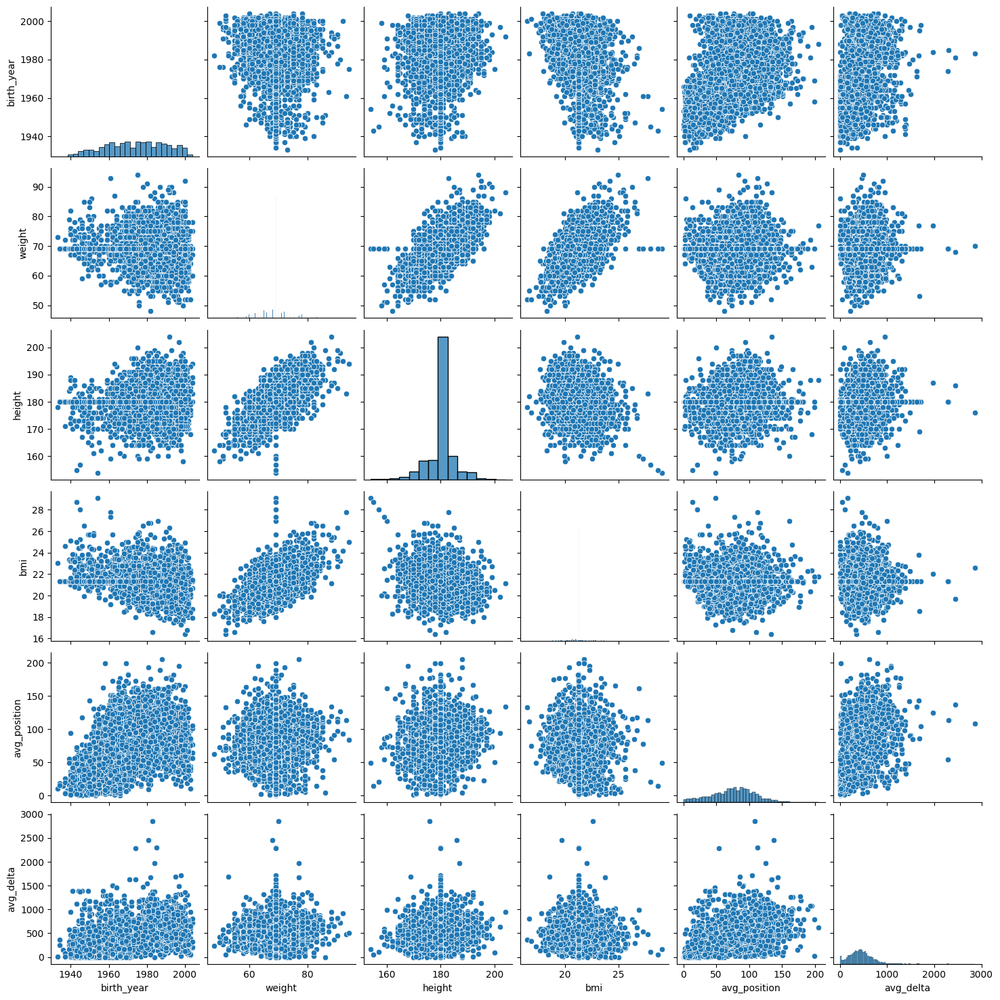

In [4]:
warnings.filterwarnings("ignore", "is_categorical_dtype")
warnings.filterwarnings("ignore", "use_inf_as_na")
sns.pairplot(cyclists)

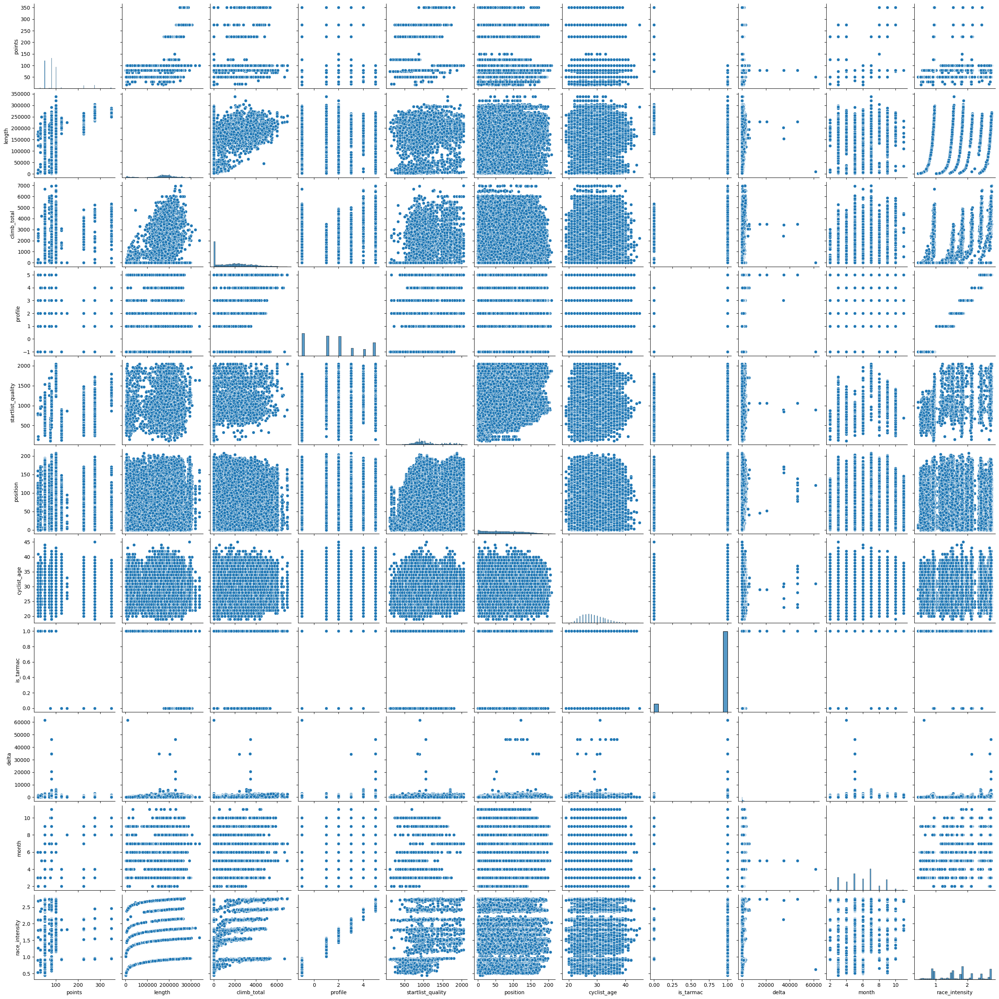

In [5]:
warnings.filterwarnings("ignore", "is_categorical_dtype")
warnings.filterwarnings("ignore", "use_inf_as_na")
races_sampled = races.sample(frac=0.1, random_state=42)
sns.pairplot(races_sampled)

We decide to apply the clustering on these pairs of features:
1. *weight* and *height*
2. *BMI* and *avg_position*
3. *avg_delta* and *avg_position*
4. *points* and *race_intensity*
5. *points* and *startlist_quality*

In the following, we create the dataframe slice of the original dataset to pass it to the clustering algorithm. Notice that for *data_pri* and *data_psq* we apply *.drop_duplicates()*, since races entries are duplicates in those attributes but differ only for attributes regarding the cyclist who attended the race.

In [6]:
data_wh = cyclists[['weight', 'height']]
data_bap = cyclists[['bmi', 'avg_position']]
data_adap = cyclists[['avg_delta', 'avg_position']]
data_pri = races.drop_duplicates(subset='_url')[['points', 'race_intensity']]
data_psq = races.drop_duplicates(subset='_url')[['points', 'startlist_quality']]

## K-means Clustering

Let's start this task with K-means clustering.
K-Means clustering is an algorithm that groups data points into *k distinct clusters* based on their similarity. It minimizes the sum of squared distances between each point and the centroid of its assigned cluster. The algorithm iteratively updates centroids and reassigns points until convergence. 
For better approximate the number of clusters, we apply the Elbow method.

### 1. Applying K-Means to *weight* and *height*.

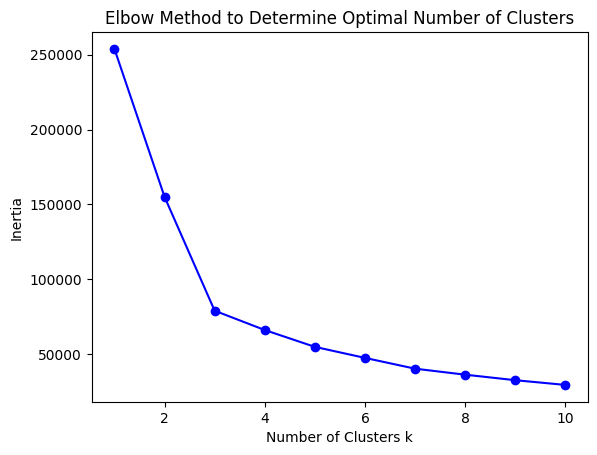

In [7]:
# Initialize an empty list to store inertia values
inertia = []
k_values = range(1, 11)

for k in k_values:
    
    kmeans = KMeans(n_clusters=k, random_state=0)
    # Fit the KMeans model on the data
    kmeans.fit(data_wh)
    # Append the inertia (sum of squared distances to centroids) for this k to the list
    inertia.append(kmeans.inertia_)

plt.plot(k_values, inertia, 'bo-')
plt.xlabel('Number of Clusters k')
plt.ylabel('Inertia')
plt.title('Elbow Method to Determine Optimal Number of Clusters')
plt.show()

From the application of the Elbow method we decide to use $k=3$

Cluster centroids [weight height]:
[[ 76.27581522 187.64402174]
 [ 68.96963177 180.0215173 ]
 [ 61.63043478 172.58754407]]
Number of cyclists in each cluster:
1    4507
2     851
0     737
Name: count, dtype: int64


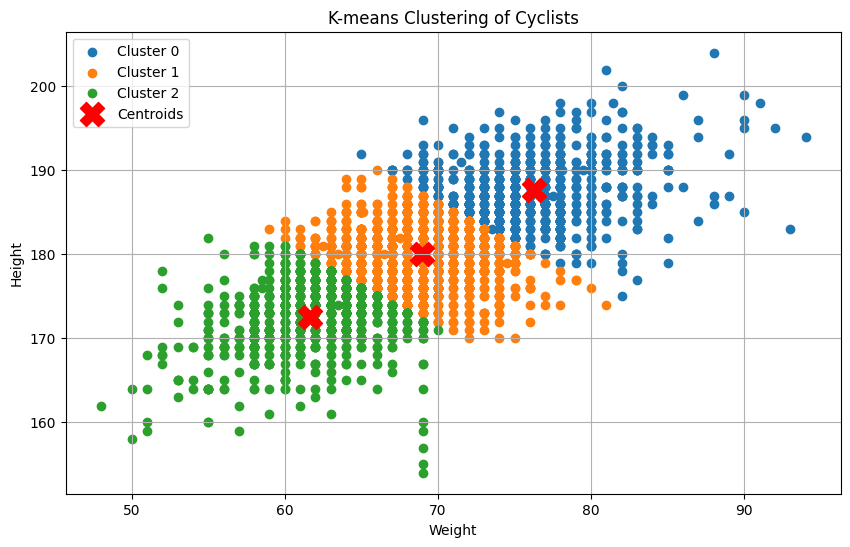

In [8]:
# Initialize KMeans with 3 clusters
kmeans = KMeans(n_clusters=3, random_state=42)

# Fit the KMeans model to the data
kmeans.fit(data_wh)

# Print the cluster centroids
print("Cluster centroids [weight height]:")
print(kmeans.cluster_centers_)

# Print the number of data points in each cluster
print("Number of cyclists in each cluster:")
print(pd.Series(kmeans.labels_).value_counts())

# Create a scatter plot for visualizing the clusters
plt.figure(figsize=(10, 6))

# Plot each cluster with a different color
for cluster_id in range(3):
    cluster_data = data_wh[kmeans.labels_ == cluster_id]
    plt.scatter(cluster_data['weight'], cluster_data['height'], label=f'Cluster {cluster_id}')

# Plot the centroids
centroids = kmeans.cluster_centers_
plt.scatter(centroids[:, 0], centroids[:, 1], s=300, c='red', marker='X', label='Centroids')

# Add labels and title
plt.xlabel('Weight')
plt.ylabel('Height')
plt.title('K-means Clustering of Cyclists')
plt.legend()
plt.grid(True)
plt.show()

Given the 3 clusters, the 3 centroids group the cyclists in a way such that one group contains the shorter and thinner cyclists, the medium high and normal weighted cyclists and the higher and heavier cyclists. By constraction, no outlier is left because they are included in the nearest cluster. 

### 2. Applying K-Means to *bmi* and *avg_position*.

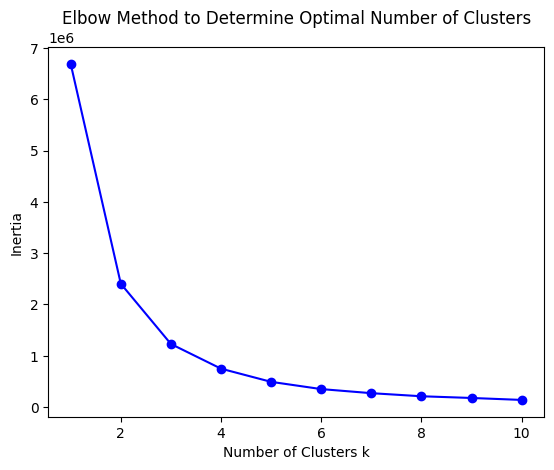

In [9]:
# Initialize an empty list to store inertia values
inertia = []
k_values = range(1, 11)

for k in k_values:
    
    kmeans = KMeans(n_clusters=k, random_state=0)
    # Fit the KMeans model on the data
    kmeans.fit(data_bap)
    # Append the inertia (sum of squared distances to centroids) for this k to the list
    inertia.append(kmeans.inertia_)

plt.plot(k_values, inertia, 'bo-')
plt.xlabel('Number of Clusters k')
plt.ylabel('Inertia')
plt.title('Elbow Method to Determine Optimal Number of Clusters')
plt.show()

From the application of the Elbow method we decide to use $k=3$.

Cluster centroids [BMI avg_position]:
[[ 21.20918625  78.08333333]
 [ 21.31472738  34.00363196]
 [ 21.28467171 116.09650794]]
Number of cyclists in each cluster:
0    2868
1    1652
2    1575
Name: count, dtype: int64


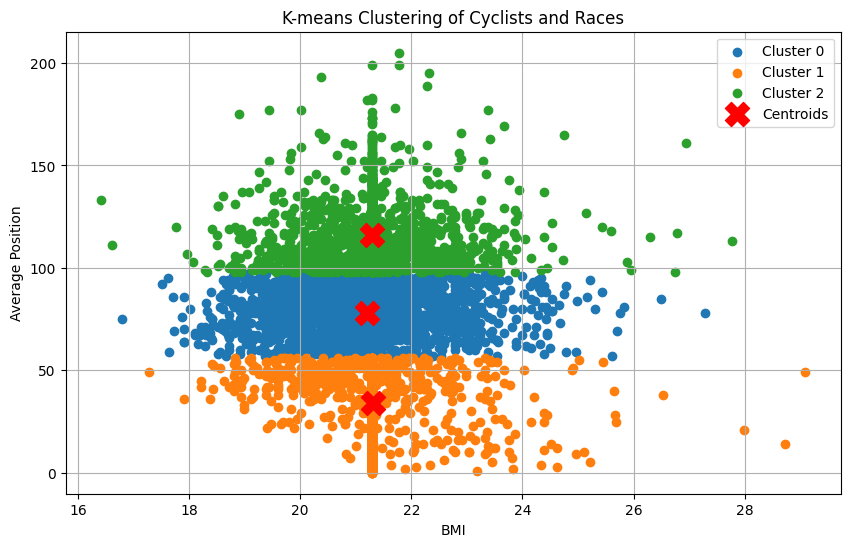

In [10]:
# Initialize KMeans with 3 clusters
kmeans = KMeans(n_clusters=3, random_state=42)

# Fit the KMeans model to the data
kmeans.fit(data_bap)

# Print the cluster centroids
print("Cluster centroids [BMI avg_position]:")
print(kmeans.cluster_centers_)

# Print the number of data points in each cluster
print("Number of cyclists in each cluster:")
print(pd.Series(kmeans.labels_).value_counts())

# Create a scatter plot for visualizing the clusters
plt.figure(figsize=(10, 6))

# Plot each cluster with a different color
for cluster_id in range(3):
    cluster_data = data_bap[kmeans.labels_ == cluster_id]
    plt.scatter(cluster_data['bmi'], cluster_data['avg_position'], label=f'Cluster {cluster_id}')

# Plot the centroids
centroids = kmeans.cluster_centers_
plt.scatter(centroids[:, 0], centroids[:, 1], s=300, c='red', marker='X', label='Centroids')

# Add labels and title
plt.xlabel('BMI')
plt.ylabel('Average Position')
plt.title('K-means Clustering of Cyclists and Races')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

The cyclists are more or less equally distributed, but we can point out the presence of a certain number of noisy values. 

### 3. Applying K-Means to *avg_delta* and *avg_position*.

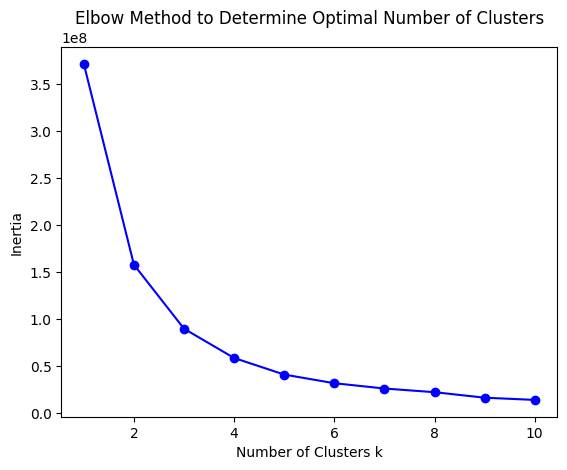

In [11]:
# Initialize an empty list to store inertia values
inertia = []
k_values = range(1, 11)

for k in k_values:
    
    kmeans = KMeans(n_clusters=k, random_state=0)
    # Fit the KMeans model on the data
    kmeans.fit(data_adap)
    # Append the inertia (sum of squared distances to centroids) for this k to the list
    inertia.append(kmeans.inertia_)

plt.plot(k_values, inertia, 'bo-')
plt.xlabel('Number of Clusters k')
plt.ylabel('Inertia')
plt.title('Elbow Method to Determine Optimal Number of Clusters')
plt.show()

From the application of the Elbow method we decide to use $k=3$.

Cluster centroids [delta position]:
[[825.20822577 102.56567593]
 [479.03935194  84.97470489]
 [199.94124275  49.8528989 ]]
Number of cyclists in each cluster:
1    2961
2    2097
0    1037
Name: count, dtype: int64


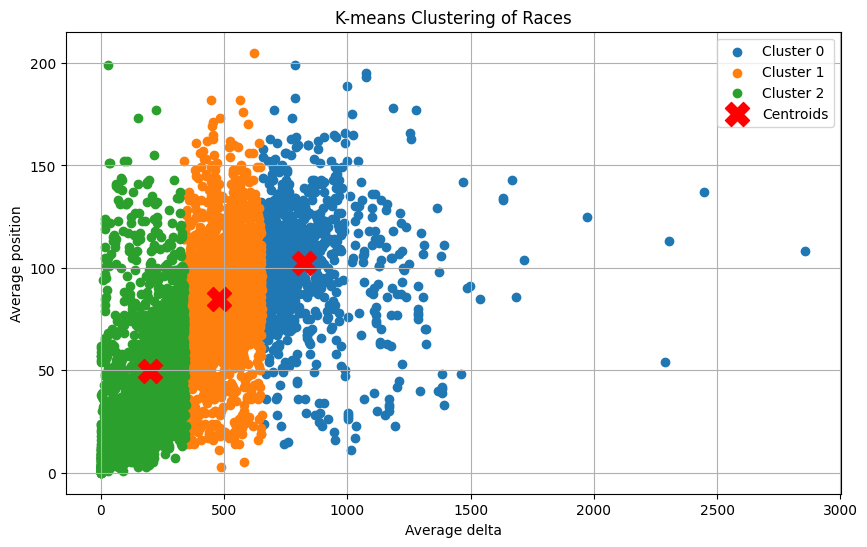

In [12]:
# Initialize KMeans with 3 clusters
kmeans = KMeans(n_clusters=3, random_state=42)

# Fit the KMeans model to the data
kmeans.fit(data_adap)

# Print the cluster centroids
print("Cluster centroids [delta position]:")
print(kmeans.cluster_centers_)

# Print the number of data points in each cluster
print("Number of cyclists in each cluster:")
print(pd.Series(kmeans.labels_).value_counts())

# Create a scatter plot for visualizing the clusters
plt.figure(figsize=(10, 6))

# Plot each cluster with a different color
for cluster_id in range(3):
    cluster_data = data_adap[kmeans.labels_ == cluster_id]
    plt.scatter(cluster_data['avg_delta'], cluster_data['avg_position'], label=f'Cluster {cluster_id}')

# Plot the centroids
centroids = kmeans.cluster_centers_
plt.scatter(centroids[:, 0], centroids[:, 1], s=300, c='red', marker='X', label='Centroids')

# Add labels and title
plt.xlabel('Average delta')
plt.ylabel('Average position')
plt.title('K-means Clustering of Races')
plt.legend()
plt.grid(True)
plt.show()

We make evidence that Cluster 2 has a lot of noisy values included; moreover, it is the cluster with less cyclists. 

### 4. Applying K-Means to *points* and *race_intensity*.

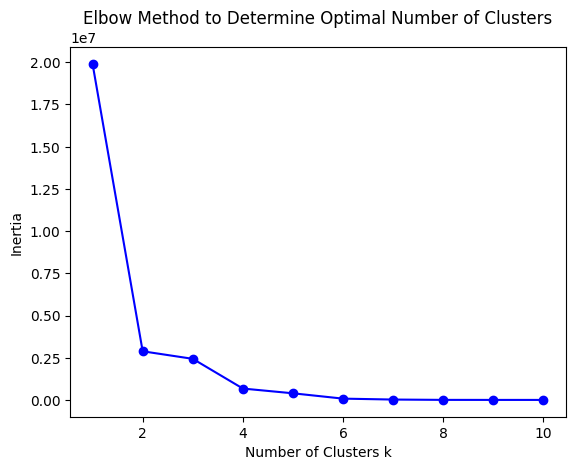

In [13]:
# Initialize an empty list to store inertia values
inertia = []
k_values = range(1, 11)

for k in k_values:
    
    kmeans = KMeans(n_clusters=k, random_state=0)
    # Fit the KMeans model on the data
    kmeans.fit(data_pri)
    # Append the inertia (sum of squared distances to centroids) for this k to the list
    inertia.append(kmeans.inertia_)

plt.plot(k_values, inertia, 'bo-')
plt.xlabel('Number of Clusters k')
plt.ylabel('Inertia')
plt.title('Elbow Method to Determine Optimal Number of Clusters')
plt.show()

For the Elbow method, we consider $k=2$. 

Cluster centroids [points race_intensity]:
[[ 70.89834416   1.48928323]
 [263.08823529   1.36024363]]
Number of races in each cluster:
0    4771
1     510
Name: count, dtype: int64


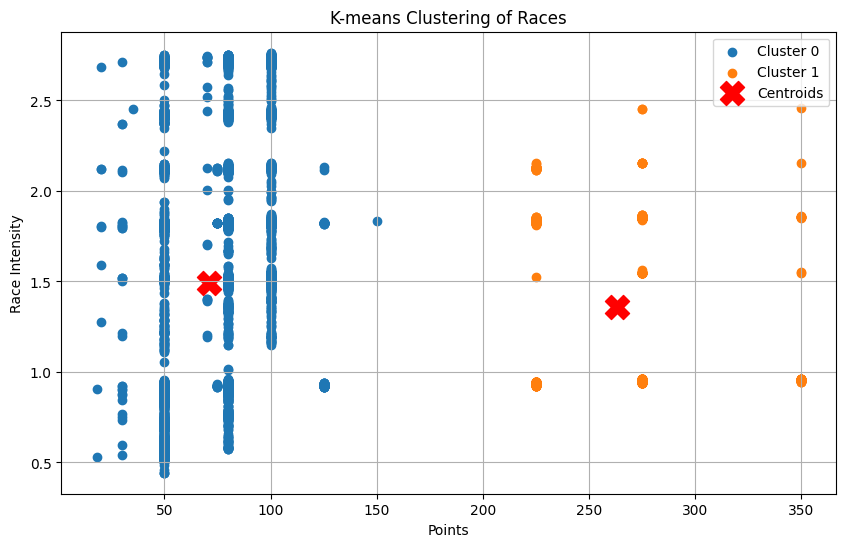

In [14]:
# Initialize KMeans with 2 clusters
kmeans = KMeans(n_clusters=2, random_state=42)

# Fit the KMeans model to the data
kmeans.fit(data_pri)

# Print the cluster centroids
print("Cluster centroids [points race_intensity]:")
print(kmeans.cluster_centers_)

# Print the number of data points in each cluster
print("Number of races in each cluster:")
print(pd.Series(kmeans.labels_).value_counts())

# Create a scatter plot for visualizing the clusters
plt.figure(figsize=(10, 6))

# Plot each cluster with a different color
for cluster_id in range(2):
    cluster_data = data_pri[kmeans.labels_ == cluster_id]
    plt.scatter(cluster_data['points'], cluster_data['race_intensity'], label=f'Cluster {cluster_id}')

# Plot the centroids
centroids = kmeans.cluster_centers_
plt.scatter(centroids[:, 0], centroids[:, 1], s=300, c='red', marker='X', label='Centroids')

# Add labels and title
plt.xlabel('Points')
plt.ylabel('Race Intensity')
plt.title('K-means Clustering of Races')
plt.legend()
plt.grid(True)
plt.show()

The gap in between the two clusters happens because of points feature definition: there are not races with points from 150 to 225. This creates two well-defined clusters where the first one is much larger than the second (almost ten times larger).

### 5. Applying K-Means to *points* and *startlist_quality*.

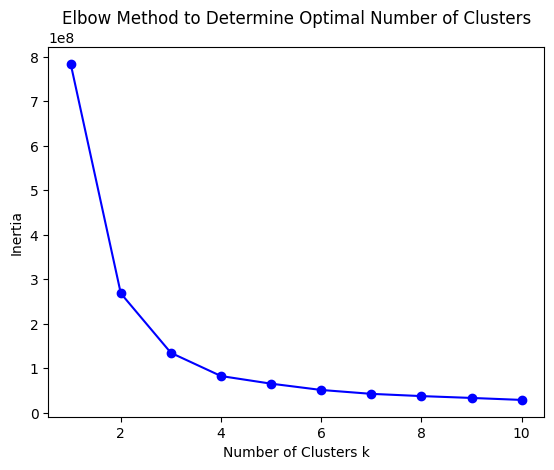

In [15]:
# Initialize an empty list to store inertia values
inertia = []
k_values = range(1, 11)

for k in k_values:
    
    kmeans = KMeans(n_clusters=k, random_state=0)
    # Fit the KMeans model on the data
    kmeans.fit(data_psq)
    # Append the inertia (sum of squared distances to centroids) for this k to the list
    inertia.append(kmeans.inertia_)

plt.plot(k_values, inertia, 'bo-')
plt.xlabel('Number of Clusters k')
plt.ylabel('Inertia')
plt.title('Elbow Method to Determine Optimal Number of Clusters')
plt.show()

For the Elbow method, we take $k=3$.

Cluster centroids [points startlist_quality]:
[[  85.8055059   981.74973186]
 [ 111.07526882 1656.82365591]
 [  83.0971686   601.37258687]]
Number of races in each cluster:
0    2775
2    1576
1     930
Name: count, dtype: int64


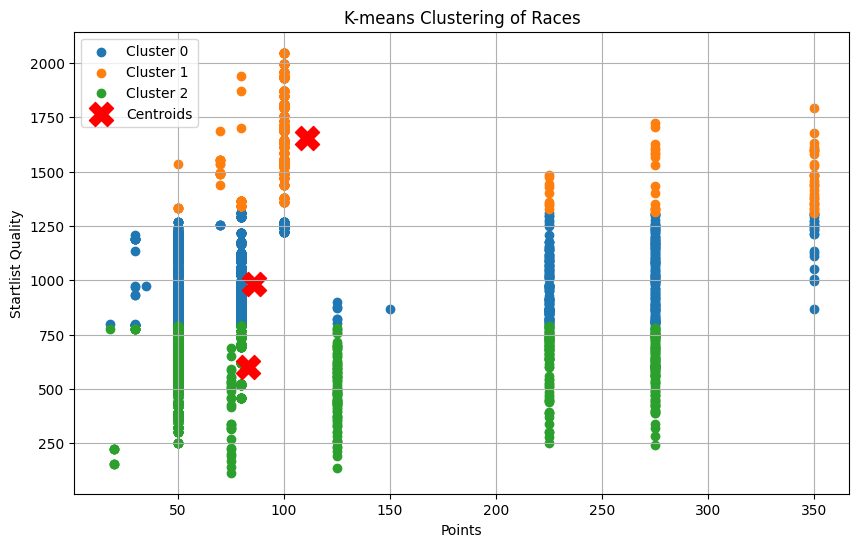

In [16]:
# Initialize KMeans with 3 clusters
kmeans = KMeans(n_clusters=3, random_state=42)

# Fit the KMeans model to the data
kmeans.fit(data_psq)

# Print the cluster centroids
print("Cluster centroids [points startlist_quality]:")
print(kmeans.cluster_centers_)

# Print the number of data points in each cluster
print("Number of races in each cluster:")
print(pd.Series(kmeans.labels_).value_counts())

# Create a scatter plot for visualizing the clusters
plt.figure(figsize=(10, 6))

# Plot each cluster with a different color
for cluster_id in range(3):
    cluster_data = data_psq[kmeans.labels_ == cluster_id]
    plt.scatter(cluster_data['points'], cluster_data['startlist_quality'], label=f'Cluster {cluster_id}')

# Plot the centroids
centroids = kmeans.cluster_centers_
plt.scatter(centroids[:, 0], centroids[:, 1], s=300, c='red', marker='X', label='Centroids')

# Add labels and title
plt.xlabel('Points')
plt.ylabel('Startlist Quality')
plt.title('K-means Clustering of Races')
plt.legend()
plt.grid(True)
plt.show()

The difference between this result and the previous one is that here *startlist_quality* is more weighted than *points*, while in the previous *points* is more weighted than *race_intensity*. This can be translated to a column-separated clustering. 

## Density-Based Clustering

DBSCAN creates clusters based on dense points employing two parameters: ***eps*** (= *max admissible distance between two near points belonging to the same cluster*) and ***min_samples*** (= *minimum number of required points for a cluster to be defined*). 
As we have done with K-mean clustering, we first proceed computing the appropriate value for these two parameters and then show the output of clustering. 
Let's begin with the easier variable to define, *min_points*. The choice of *min_samples* is pretty arbitrary: the more our data is omogenous, the more we can increase this value. Tipically, it is defined to be the size of our feature plus 1 (for us, always 3).
 For what concerns *eps*, the k-nearest neighbors (k-NN) outputs a plot: in the point where the curve starts, *eps* should be chosen.

### 1. Applying DBSCAN to *weight* and *height*.

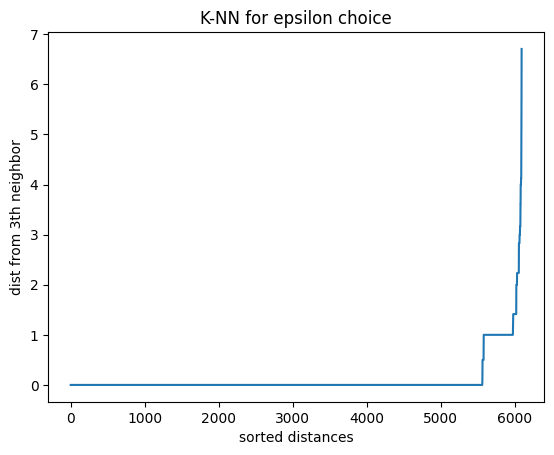

In [17]:
# Compute the pairwise Euclidean distances between 'weight' and 'height' rows
dist = pdist(data_wh, 'euclidean')
# Convert the pairwise distances into a square matrix  
dist = squareform(dist) 
# Consider the 3 nearest neighbors
min_samples = 3
kth_distances = list()
for d in dist:
    index_kth_distance = np.argsort(d)[min_samples]
    kth_distances.append(d[index_kth_distance])
# Plot the sorted k-th nearest distances
plt.plot(range(0, len(kth_distances)), sorted(kth_distances))
plt.ylabel('dist from %sth neighbor' % min_samples)
plt.xlabel('sorted distances')
plt.title('K-NN for epsilon choice')
plt.show()

We select $eps = 2.5$.

<Axes: xlabel='weight', ylabel='height'>

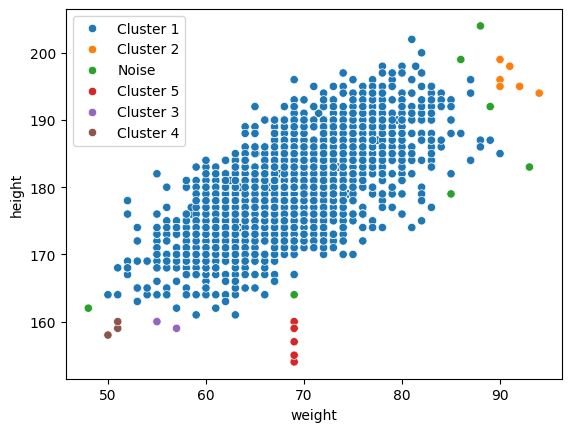

In [18]:
dbscan = DBSCAN(eps=2.5, min_samples=3)
dbscan.fit(data_wh)
labels = dbscan.labels_
unique_labels, counts = np.unique(labels, return_counts=True)
np.unique(dbscan.labels_, return_counts=True)
label_mapping = {label: f"Cluster {label + 1}" if label != -1 else "Noise" for label in unique_labels}
sns.scatterplot(data=data_wh, x="weight", y="height", hue=[label_mapping[label] for label in labels], palette="tab10", legend='full')

The plot shows a bigger clustering where the majority of cyclists are in (this means their values are not so distant from our chosen epsilon), while there are some smaller clustering concentrated on the border of the bigger cluster. Some noisy values are identified in its border too.

### 2. Applying DBSCAN to *bmi* and *avg_position*.

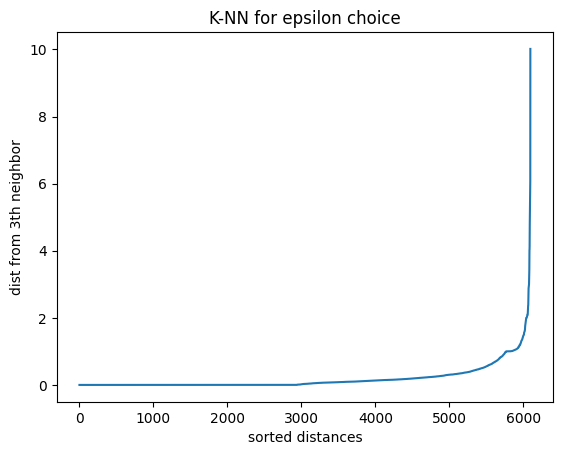

In [19]:
# Compute the pairwise Euclidean distances between 'bmi' and 'avg_position' rows
dist = pdist(data_bap, 'euclidean')
# Convert the pairwise distances into a square matrix  
dist = squareform(dist) 
# Consider the 3 nearest neighbors
min_samples = 3
kth_distances = list()
for d in dist:
    index_kth_distance = np.argsort(d)[min_samples]
    kth_distances.append(d[index_kth_distance])
# Plot the sorted k-th nearest distances
plt.plot(range(0, len(kth_distances)), sorted(kth_distances))
plt.ylabel('dist from %sth neighbor' % min_samples)
plt.xlabel('sorted distances')
plt.title('K-NN for epsilon choice')
plt.show()

We selected $eps = 2.5$.

<Axes: xlabel='bmi', ylabel='avg_position'>

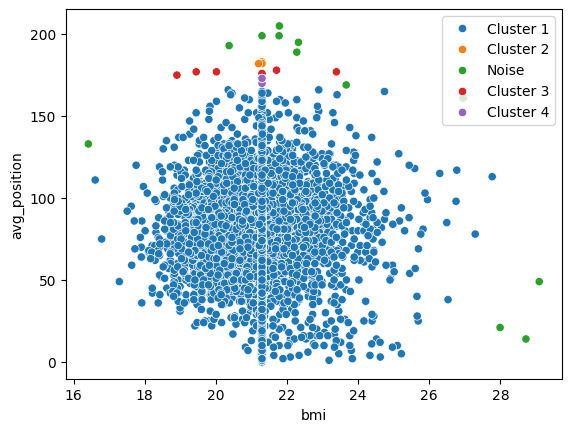

In [20]:
dbscan = DBSCAN(eps=2.5, min_samples=3)
dbscan.fit(data_bap)
labels = dbscan.labels_
unique_labels, counts = np.unique(labels, return_counts=True)
label_mapping = {label: f"Cluster {label + 1}" if label != -1 else "Noise" for label in unique_labels}
sns.scatterplot(data=data_bap, x="bmi", y="avg_position", hue=[label_mapping[label] for label in labels], palette="tab10", legend='full')

The output shows a bigger cluster here with smaller ones in the border and the presence of some noisy values (the green ones) beyond all clusters, like the previous result.

### 3. Applying DBSCAN to *avg_delta* and *avg_position*.

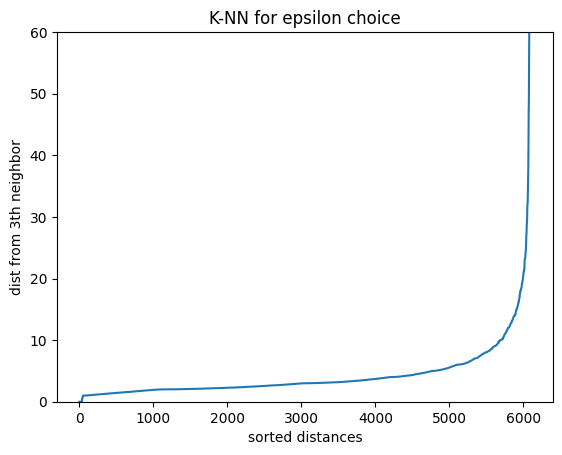

In [21]:
# Compute the pairwise Euclidean distances between 'bmi' and 'avg_position' rows
dist = pdist(data_adap, 'euclidean')
# Convert the pairwise distances into a square matrix  
dist = squareform(dist) 
# Consider the 3 nearest neighbors
min_samples = 3
kth_distances = list()
for d in dist:
    index_kth_distance = np.argsort(d)[min_samples]
    kth_distances.append(d[index_kth_distance])
# Plot the sorted k-th nearest distances
plt.plot(range(0, len(kth_distances)), sorted(kth_distances))
plt.ylabel('dist from %sth neighbor' % min_samples)
plt.xlabel('sorted distances')
plt.title('K-NN for epsilon choice')
plt.ylim(0,60)
plt.show()

We selected $eps = 15$.

<Axes: xlabel='avg_delta', ylabel='avg_position'>

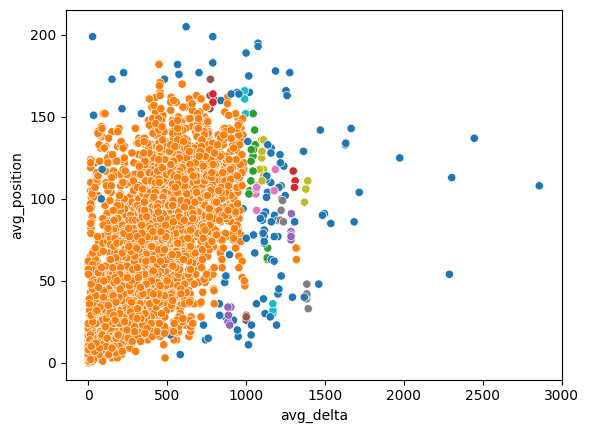

In [22]:
dbscan = DBSCAN(eps=15, min_samples=3)
dbscan.fit(data_adap)
np.unique(dbscan.labels_, return_counts=True)
sns.scatterplot(data=data_adap, x="avg_delta", y="avg_position", hue=dbscan.labels_, palette="tab10", legend='')

Similarly to the previous clustering, there is a bigger one and a lot of very small cluster. A little difference is that the number of noisy values (the blue ones) are of a considerable number. We decided not to show the legend because of the very high number of less numerous clusters: we underline the fact that the choice of *min_samples=3* directly influence this.

### 4. Applying DBSCAN to *points* and *race_intensity*.

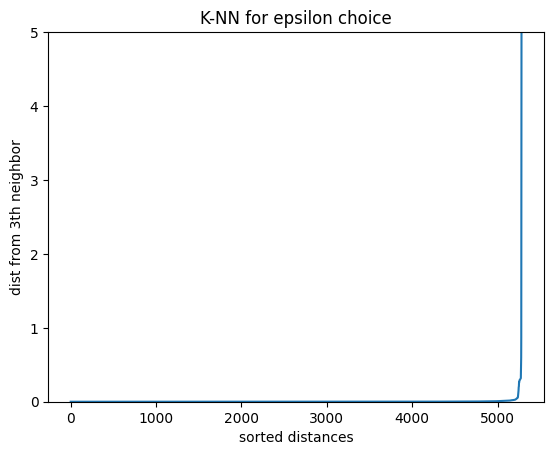

In [23]:
# Compute the pairwise Euclidean distances between 'points' and 'race_intensity' rows
dist = pdist(data_pri, 'euclidean')
# Convert the pairwise distances into a square matrix  
dist = squareform(dist) 
# Consider the 3 nearest neighbors
min_samples = 3
kth_distances = list()
for d in dist:
    index_kth_distance = np.argsort(d)[min_samples]
    kth_distances.append(d[index_kth_distance])
# Plot the sorted k-th nearest distances
plt.plot(range(0, len(kth_distances)), sorted(kth_distances))
plt.ylabel('dist from %sth neighbor' % min_samples)
plt.xlabel('sorted distances')
plt.title('K-NN for epsilon choice')
plt.ylim(0, 5)
plt.show()

We selected $eps = 1$. Even if the curve is defined for a smaller value, this could result in an excessive number of very small cluster that would not be so relevant for our analysis.  

<Axes: xlabel='points', ylabel='race_intensity'>

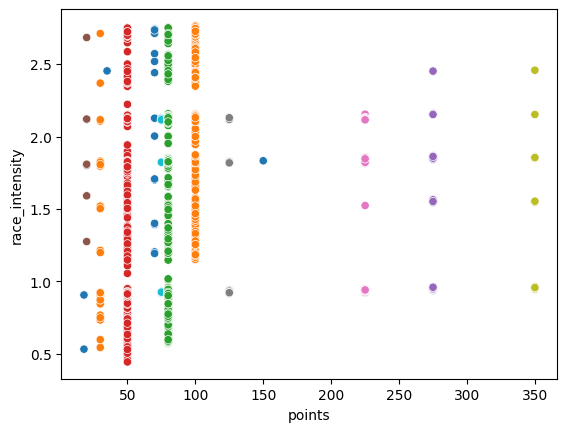

In [24]:
# Apply the DBSCAN algorithm
dbscan = DBSCAN(eps=1, min_samples=3)
dbscan.fit(data_pri)
# Get the unique labels and their counts and plot the clusters 
np.unique(dbscan.labels_, return_counts=True)
sns.scatterplot(data=data_pri, x="points", y="race_intensity", hue=dbscan.labels_, palette="tab10", legend='')

### 5. Applying DBSCAN to *points* and *startlist_quality*.

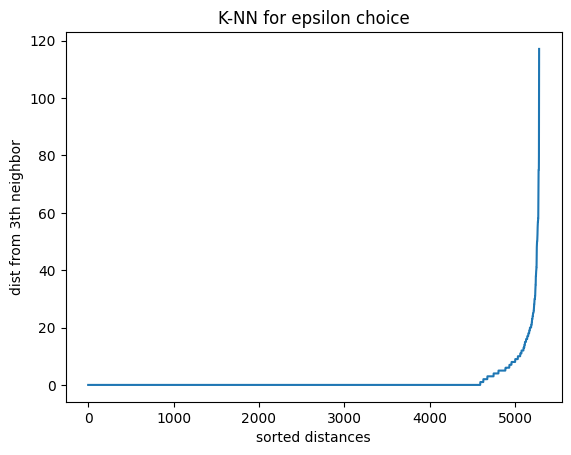

In [25]:
# Compute the pairwise Euclidean distances between 'points' and 'race_intensity' rows
dist = pdist(data_psq, 'euclidean')
# Convert the pairwise distances into a square matrix  
dist = squareform(dist) 
# Consider the 3 nearest neighbors
min_samples = 3
kth_distances = list()
for d in dist:
    index_kth_distance = np.argsort(d)[min_samples]
    kth_distances.append(d[index_kth_distance])
# Plot the sorted k-th nearest distances
plt.plot(range(0, len(kth_distances)), sorted(kth_distances))
plt.ylabel('dist from %sth neighbor' % min_samples)
plt.xlabel('sorted distances')
plt.title('K-NN for epsilon choice')
plt.show()

We selected $eps = 25$. As we can see some clusters don't have a clear separation, this happens because the distribution of the data over *points* focuses on fixed assigned values (50, 75, 100, etc.), while *startlist_quality* has a wider distribution. It's clear evidence that DBSCAN method is not appropriate for this pair of features.

<Axes: xlabel='points', ylabel='startlist_quality'>

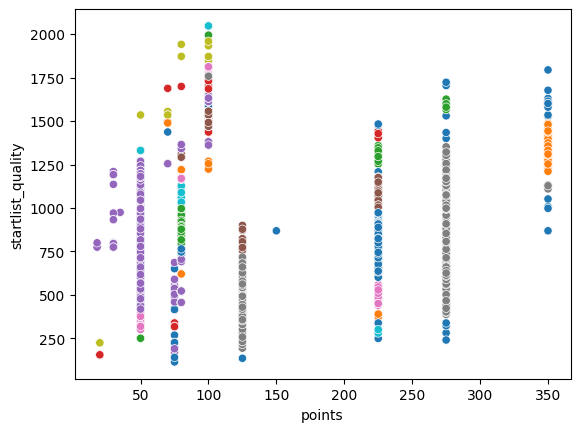

In [26]:
# Apply the DBSCAN algorithm
dbscan = DBSCAN(eps=25, min_samples=3)
dbscan.fit(data_psq)
# Get the unique labels and their counts and plot the clusters 
np.unique(dbscan.labels_, return_counts=True)
sns.scatterplot(data=data_psq, x="points", y="startlist_quality", hue=dbscan.labels_, palette="tab10", legend='')

## Hierarchical Clustering

The dendrograms provide a visualization of hierarchical clustering various methods:

1. *Complete Linkage*: this method shows clusters with a strong preference for compact groupings, as the distance between clusters is determined by their farthest points. In this case, the method has created clusters that are relatively distinct, with noticeable gaps between branches at higher linkage distances. This indicates the presence of well-separated clusters in the dataset.

2. *Single Linkage*:  in this method, clusters merge based on the closest points. This leads to an elongated structure where many points or smaller groups merge at low distances, resulting in one large cluster at higher levels. Very sensitive to  noise

3. *Average Linkage*: this methods provides a middle ground, balancing the behavior of complete and single linkage. The resulting clusters appear more uniform.

4. *Ward Linkage*: minimizes the variance within clusters at each step, resulting in highly compact and spherical clusters. 

In [27]:
#
# Perform divisive hierarchical clustering on a dataset to create a specified number of clusters.
#
# The function starts with all data points in a single cluster and iteratively splits the largest cluster 
# using K-means into two sub-clusters until the desired number of clusters is reached.
#
# Parameters:
# data (numpy array): The dataset to cluster, where each row represents a data point.
# max_clusters (int): Maximum number of clusters to form.
#
# Returns:
# numpy array: An array of cluster labels corresponding to each data point.
#
def divisive_clustering(data, max_clusters=3):
    # Start with all points in one cluster
    clusters = {0: data}
    cluster_assignments = np.zeros(data.shape[0], dtype=int)
    next_cluster_id = 1

    # Dictionary to keep track of cluster splitting hierarchy
    parent_to_children = {}

    while len(clusters) < max_clusters:
        # Find the cluster to split (largest cluster)
        largest_cluster = max(clusters, key=lambda k: len(clusters[k]))
        cluster_data = clusters.pop(largest_cluster)

        # Perform a 2-means split
        kmeans = KMeans(n_clusters=2, random_state=42)
        labels = kmeans.fit_predict(cluster_data)

        # Get indices of points in the original dataset belonging to the current cluster
        cluster_indices = np.where(cluster_assignments == largest_cluster)[0]

        # Assign new cluster IDs correctly
        child_1_id = next_cluster_id
        child_2_id = next_cluster_id + 1
        clusters[child_1_id] = cluster_data[labels == 0]
        clusters[child_2_id] = cluster_data[labels == 1]

        cluster_assignments[cluster_indices[labels == 0]] = child_1_id
        cluster_assignments[cluster_indices[labels == 1]] = child_2_id

        # Track hierarchy
        parent_to_children[largest_cluster] = (child_1_id, child_2_id)

        # Increment cluster ID for next iteration
        next_cluster_id += 2

    # Ensure consistency of cluster IDs
    return cluster_assignments




### 1. Applying Hierarchical clustering to *weight* and *height*.

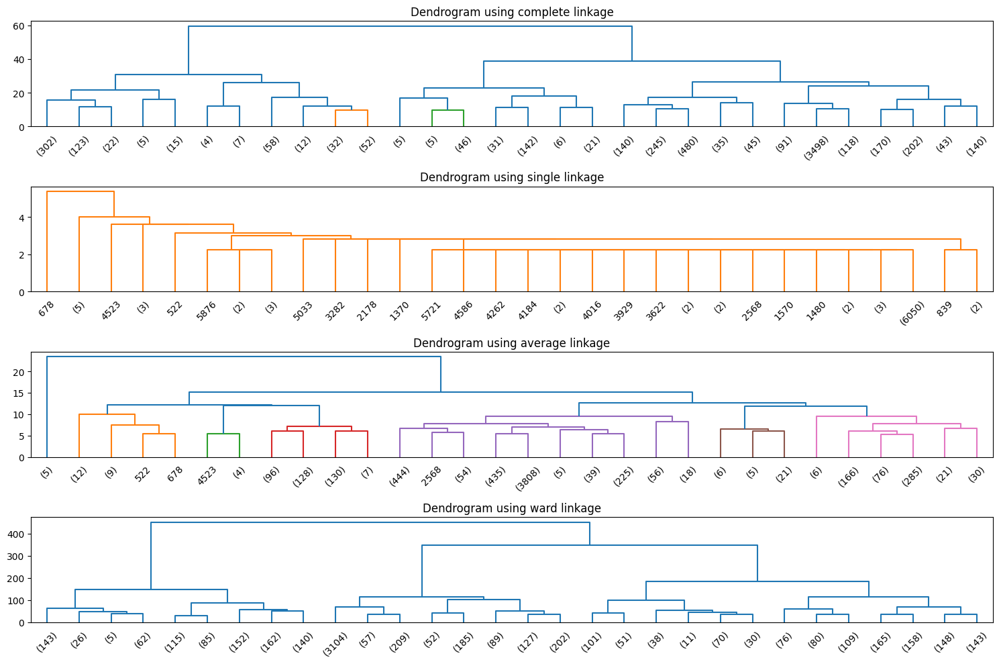

In [28]:
# Calculate distances and build dendrograms with different linkage methods
methods = ['complete', 'single', 'average','ward']
plt.figure(figsize=(15, 10))
for i, method in enumerate(methods, 1):
    plt.subplot(4, 1, i)
    data_dist = pdist(data_wh, metric='euclidean')
    data_link = linkage(data_dist, method=method)
    dendrogram(data_link, color_threshold=10, truncate_mode='lastp')
    plt.title(f'Dendrogram using {method} linkage')
plt.tight_layout()
plt.show()

As we can see from this images, the complete linkage create clusters which are very well distincted.
The single linkage seems to group outliers or sparse points early, potentially masking the natural cluster structure.
For the average linkage dendrogram, the even spacing between the branches indicates that this method avoids both the over-segmentation of complete linkage and the chaining of single linkage.
And lastly for the ward linkage creates compacted and spherical clusters.

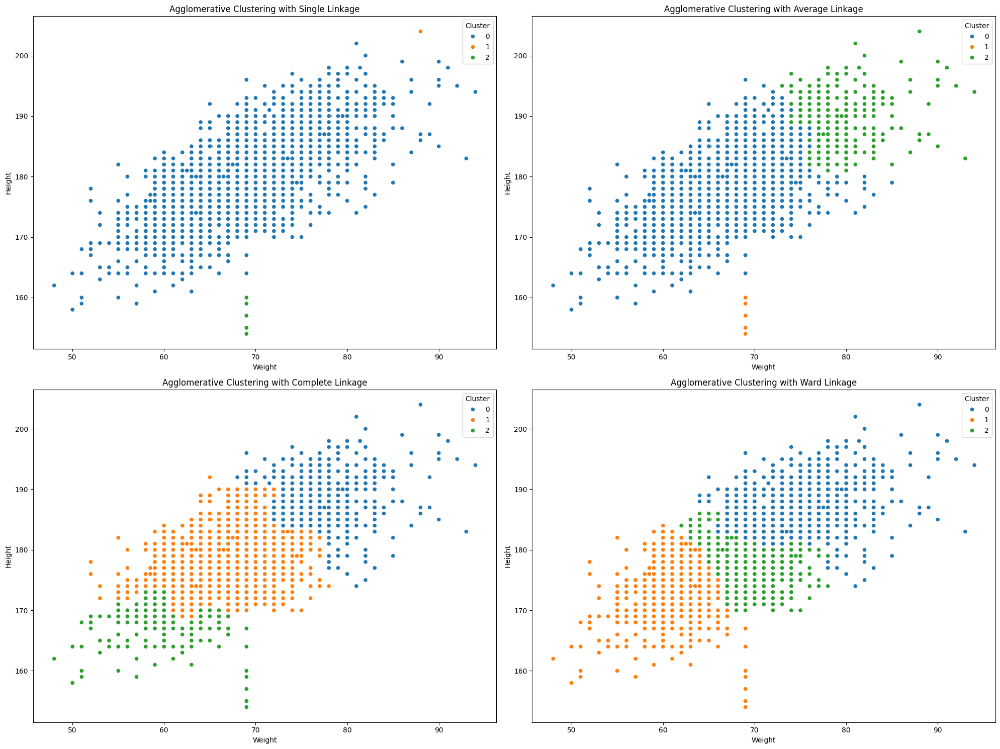

In [29]:
# List of linkage methods
linkage_methods = ['single', 'average', 'complete', 'ward']

# Create a plot for each linkage method
plt.figure(figsize=(20, 15))
for i, method in enumerate(linkage_methods, 1):
    # Create the clustering model
    agg_cluster = AgglomerativeClustering(n_clusters=3, metric='euclidean', linkage=method)
    
    # Use .loc to avoid the SettingWithCopyWarning
    data_wh = data_wh.copy()
    data_wh.loc[:, 'cluster'] = agg_cluster.fit_predict(data_wh[['weight', 'height']])

    # Create the scatter plot
    plt.subplot(2, 2, i)
    sns.scatterplot(data=data_wh, x='weight', y='height', hue='cluster', palette=sns.color_palette(n_colors=3))
    plt.title(f'Agglomerative Clustering with {method.capitalize()} Linkage')
    plt.xlabel('Weight')
    plt.ylabel('Height')
    plt.legend(title='Cluster')

plt.tight_layout()
plt.show()


We see that with single linkage the clustering doesn't quite work. more specifically it separets from the main cluster only the more distant values.
Similarly the average with some more values as the opposing clusters.

Complete and ward linkage instead gives us 3 cluster well defined. it's relevant to notice that with complete linkage in this case the line between clusters is not so well defined in case of the green and blue clusters. Instead with ward both clusters appear to have a well defined line that separetes them

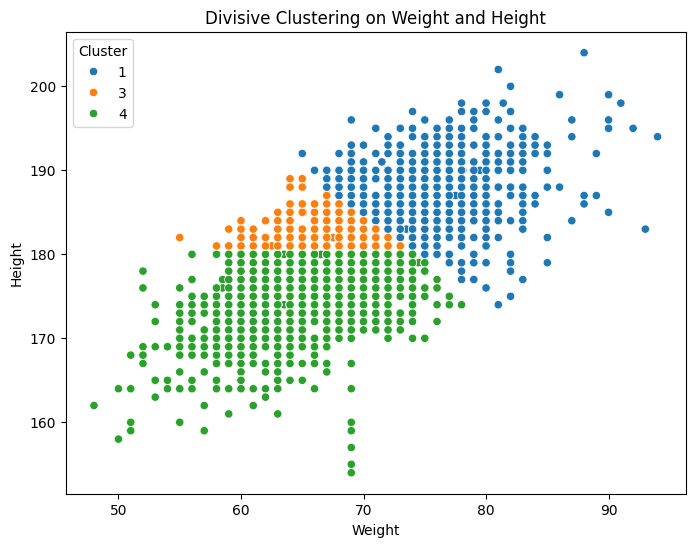

In [30]:
# Filter height and weight
data_wh = data_wh[['height', 'weight']].to_numpy()

# Apply divisive clustering
n_clusters = 3
cluster_labels = divisive_clustering(data_wh, max_clusters=n_clusters)

# Display the clusters
plt.figure(figsize=(8, 6))
sns.scatterplot(x=data_wh[:, 1], y=data_wh[:, 0], hue=cluster_labels, palette=sns.color_palette(n_colors=n_clusters))
plt.title('Divisive Clustering on Weight and Height')
plt.xlabel('Weight')
plt.ylabel('Height')
plt.legend(title='Cluster')
plt.show()


The algorithm finds these three clusters that are very near to the K-means clustering separation.

### 2. Applying Hierarchical clustering to *avg_position* and *bmi*.

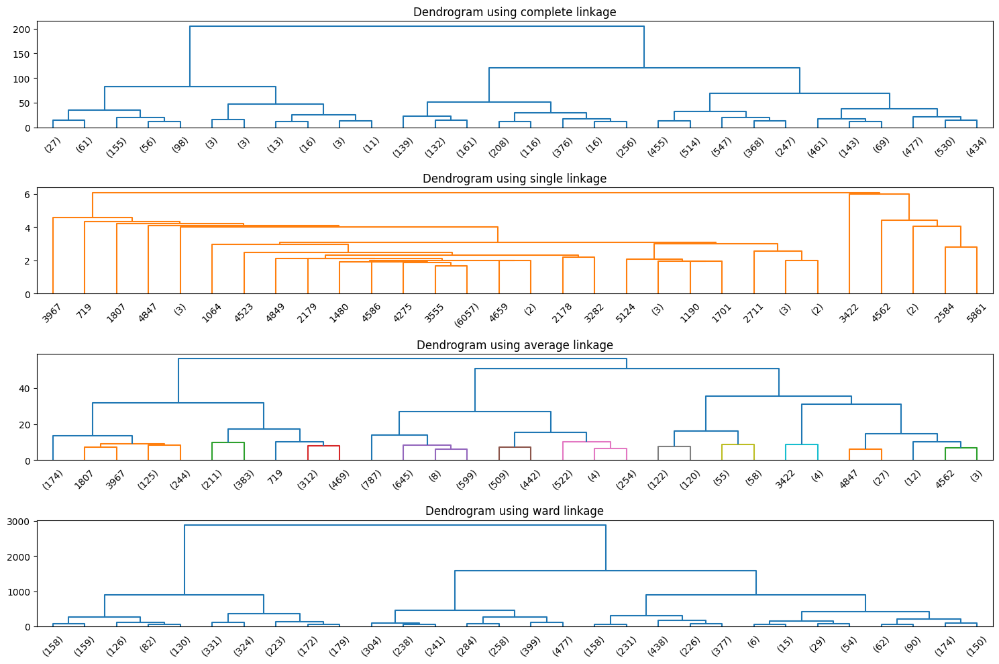

In [31]:
# Calculate distances and build dendrograms with different linkage methods
methods = ['complete', 'single', 'average','ward']
plt.figure(figsize=(15, 10))
for i, method in enumerate(methods, 1):
    plt.subplot(4, 1, i)
    data_dist = pdist(data_bap, metric='euclidean')
    data_link = linkage(data_dist, method=method)
    dendrogram(data_link, color_threshold=10, truncate_mode='lastp')
    plt.title(f'Dendrogram using {method} linkage')
plt.tight_layout()
plt.show()

The complete linkage dendrogram for bmi and position behave in similar but slighlty different way in respect to de wheigh and height dendrogram. The height of the branch now is different. Even single linkage behaves differently having a lot of disntance between values. Ward is more compact

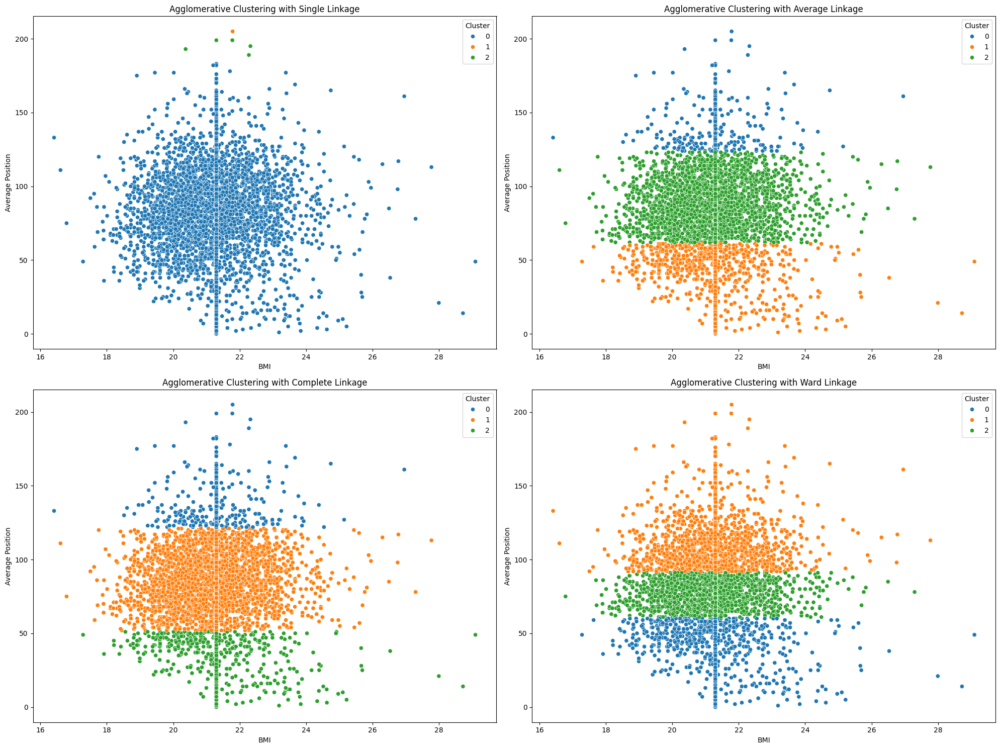

In [32]:
# List of linkage methods
linkage_methods = ['single', 'average', 'complete', 'ward']

# Create a plot for each linkage method
plt.figure(figsize=(20, 15))
for i, method in enumerate(linkage_methods, 1):
    # Create the clustering model
    agg_cluster = AgglomerativeClustering(n_clusters=3, metric='euclidean', linkage=method)
    
    # Use .loc to avoid the SettingWithCopyWarning
    data_bap = data_bap.copy()
    data_bap.loc[:, 'cluster'] = agg_cluster.fit_predict(data_bap[['bmi', 'avg_position']])

    # Create the scatter plot
    plt.subplot(2, 2, i)
    sns.scatterplot(data=data_bap, x='bmi', y='avg_position', hue='cluster', palette=sns.color_palette(n_colors=3))
    plt.title(f'Agglomerative Clustering with {method.capitalize()} Linkage')
    plt.xlabel('BMI')
    plt.ylabel('Average Position')
    plt.legend(title='Cluster')

plt.tight_layout()
plt.show()


As before we have a main cluster for single linkage with a couple of points that creates the other 2 clusters,obviously this is not a good clustering so we try with complete linkage. Complete linkage distribute for rows the dataset. even ward does exactly this but it reduce the central cluster.

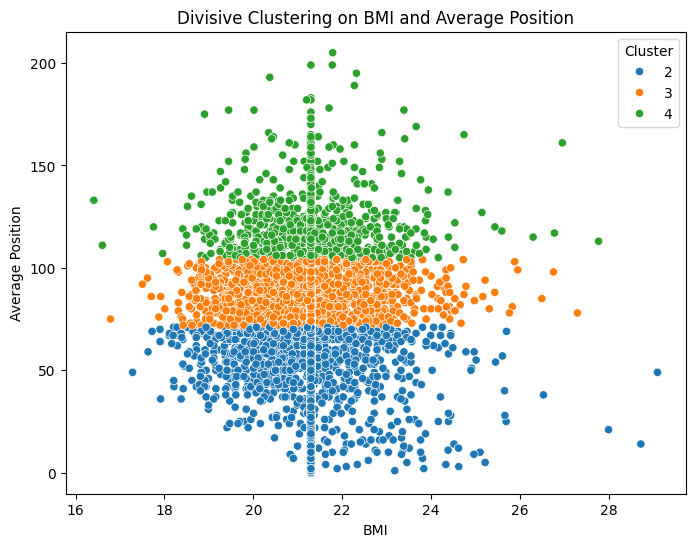

In [33]:
# Filter height and weight
data_bap = data_bap[['bmi', 'avg_position']].to_numpy()

# Apply divisive clustering
n_clusters = 3
cluster_labels = divisive_clustering(data_bap, max_clusters=n_clusters)

# Display the clusters
plt.figure(figsize=(8, 6))
sns.scatterplot(x=data_bap[:, 0], y=data_bap[:, 1], hue=cluster_labels, palette=sns.color_palette(n_colors=n_clusters))
plt.title('Divisive Clustering on BMI and Average Position')
plt.xlabel('BMI')
plt.ylabel('Average Position')
plt.legend(title='Cluster')
plt.show()


With the divisive we now see that the result is very close to the ward from before. it distributes in rows the dataset.

### 3. Applying Hierarchical clustering to *avg_delta* and *avg_position*.

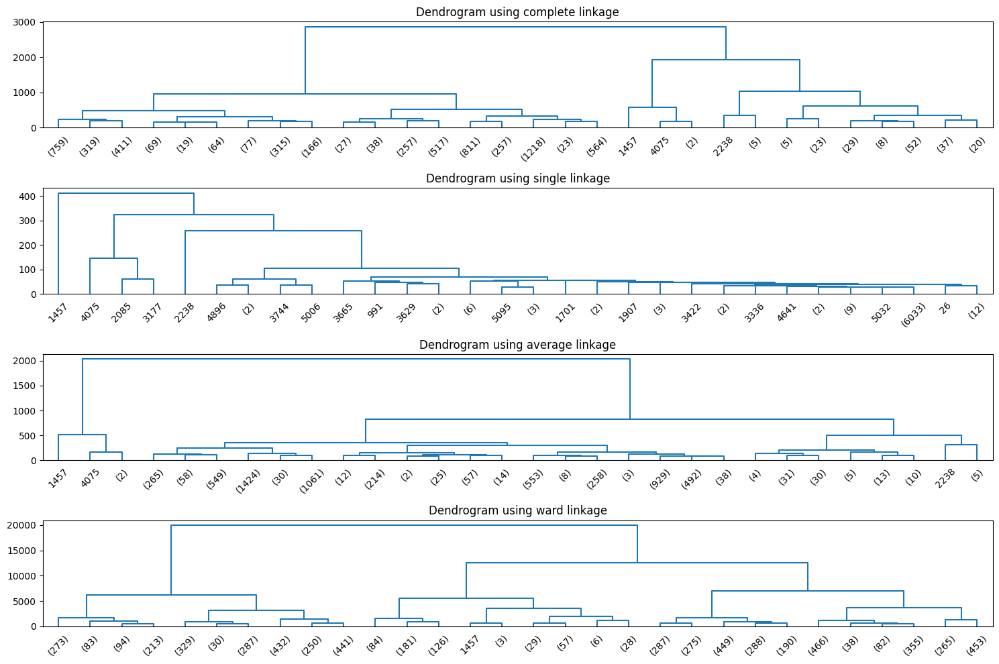

In [34]:
# Calculate distances and build dendrograms with different linkage methods
methods = ['complete', 'single', 'average','ward']
plt.figure(figsize=(15, 10))
for i, method in enumerate(methods, 1):
    plt.subplot(4, 1, i)
    data_dist = pdist(data_adap, metric='euclidean')
    data_link = linkage(data_dist, method=method)
    dendrogram(data_link, color_threshold=10, truncate_mode='lastp')
    plt.title(f'Dendrogram using {method} linkage')
plt.tight_layout()
plt.show()

With single linkage we notice that a part of the dataset is very close and very similar, the other part instead is more sparce and distant.
Ward rimain similar as before having very compact clusters. 
Average linkage is closer to single linkage in respect to those showed before. we can see that by looking at how compact and close the height of the branches are

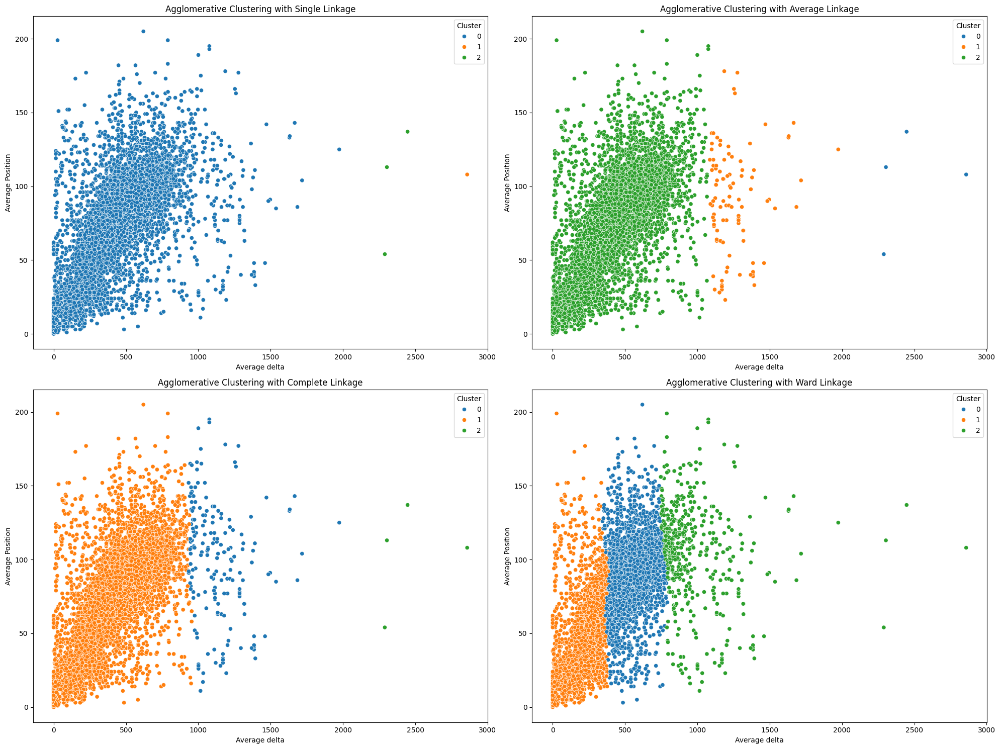

In [35]:
# List of linkage methods
linkage_methods = ['single', 'average', 'complete', 'ward']

# Create a plot for each linkage method
plt.figure(figsize=(20, 15))
for i, method in enumerate(linkage_methods, 1):
    # Create the clustering model
    agg_cluster = AgglomerativeClustering(n_clusters=3, metric='euclidean', linkage=method)
    
    # Use .loc to avoid the SettingWithCopyWarning
    data_adap = data_adap.copy()
    data_adap.loc[:, 'cluster'] = agg_cluster.fit_predict(data_adap[['avg_delta', 'avg_position']])

    # Create the scatter plot
    plt.subplot(2, 2, i)
    sns.scatterplot(data=data_adap, x='avg_delta', y='avg_position', hue='cluster', palette=sns.color_palette(n_colors=3))
    plt.title(f'Agglomerative Clustering with {method.capitalize()} Linkage')
    plt.xlabel('Average delta')
    plt.ylabel('Average Position')
    plt.legend(title='Cluster')

plt.tight_layout()
plt.show()

As before the single linkage creates a main cluster and for the other 2 it puts only a few elements in there. As note in the previous annotation, Average linkage is very close to single linkage in this case. From complete and ward we observe that it separetes in column the data with the ward being better in dividing. 

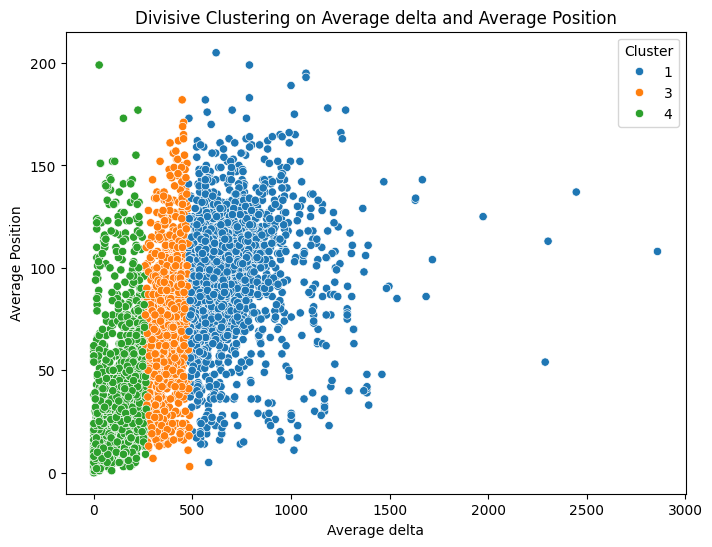

In [36]:
data_adap = data_adap[['avg_delta', 'avg_position']].to_numpy()

# Apply divisive clustering
n_clusters = 3
cluster_labels = divisive_clustering(data_adap, max_clusters=n_clusters)

# Display the clusters
plt.figure(figsize=(8, 6))
sns.scatterplot(x=data_adap[:, 0], y=data_adap[:, 1], hue=cluster_labels, palette=sns.color_palette(n_colors=n_clusters))
plt.title('Divisive Clustering on Average delta and Average Position')
plt.xlabel('Average delta')
plt.ylabel('Average Position')
plt.legend(title='Cluster')
plt.show()

Exactly as before this divisive method is very close to the ward.

### 4. Applying Hierarchical clustering to *points* and *race_intensity*.

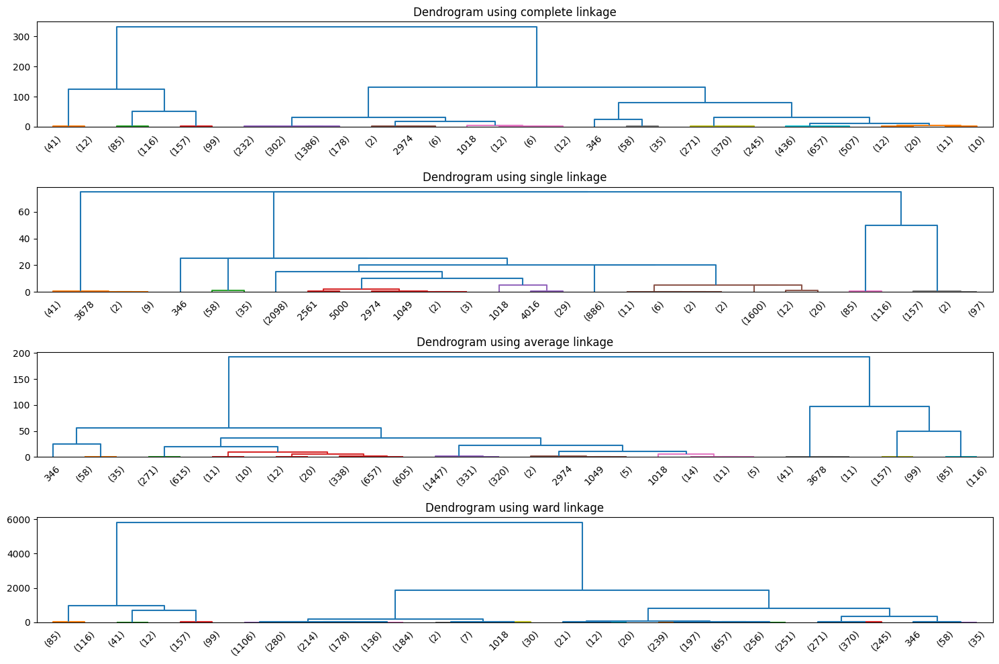

In [37]:

# Calculate distances and build dendrograms with different linkage methods
methods = ['complete', 'single', 'average','ward']
plt.figure(figsize=(15, 10))
for i, method in enumerate(methods, 1):
    plt.subplot(4, 1, i)
    data_dist = pdist(data_pri, metric='euclidean')
    data_link = linkage(data_dist, method=method)
    dendrogram(data_link, color_threshold=10, truncate_mode='lastp')
    plt.title(f'Dendrogram using {method} linkage')
plt.tight_layout()
plt.show()

From this dendograms we already see that the data is very close in differents clusters

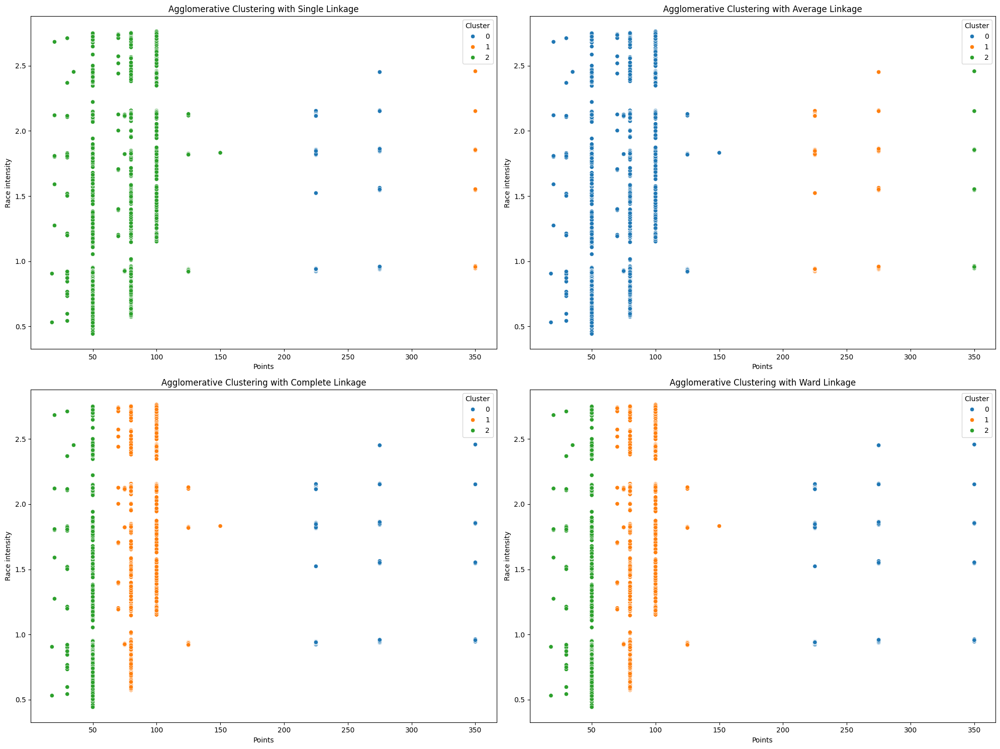

In [38]:
# List of linkage methods
linkage_methods = ['single', 'average', 'complete', 'ward']

# Create a plot for each linkage method
plt.figure(figsize=(20, 15))
for i, method in enumerate(linkage_methods, 1):
    # Create the clustering model
    agg_cluster = AgglomerativeClustering(n_clusters=3, metric='euclidean', linkage=method)
    
    # Use .loc to avoid the SettingWithCopyWarning
    data_pri = data_pri.copy()
    data_pri.loc[:, 'cluster'] = agg_cluster.fit_predict(data_pri[['points', 'race_intensity']])

    # Create the scatter plot
    plt.subplot(2, 2, i)
    sns.scatterplot(data=data_pri, x='points', y='race_intensity', hue='cluster', palette=sns.color_palette(n_colors=3))
    plt.title(f'Agglomerative Clustering with {method.capitalize()} Linkage')
    plt.xlabel('Points')
    plt.ylabel('Race intensity')
    plt.legend(title='Cluster')

plt.tight_layout()
plt.show()

Since the data is well separeted in columns all of this methods are actually quite good, we notice that complete and ward are exactly the same and also single and average linkage are the same.

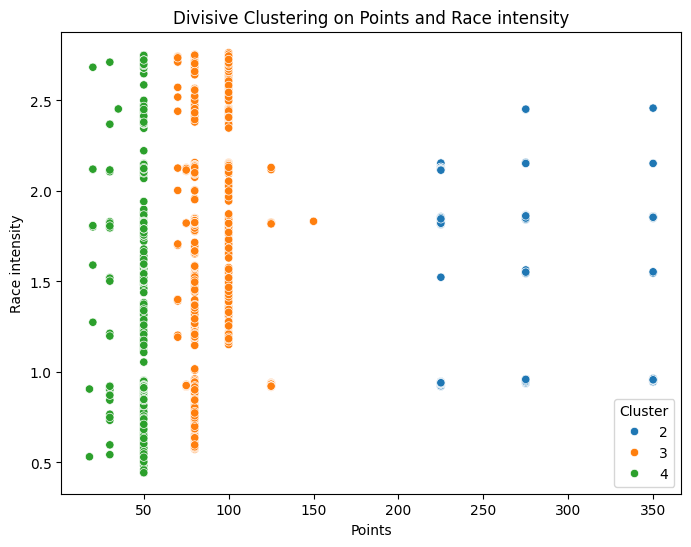

In [39]:
data_pri = data_pri[['points', 'race_intensity']].to_numpy()

# Apply divisive clustering
n_clusters = 3
cluster_labels = divisive_clustering(data_pri, max_clusters=n_clusters)

# Display the clusters
plt.figure(figsize=(8, 6))
sns.scatterplot(x=data_pri[:, 0], y=data_pri[:, 1], hue=cluster_labels, palette=sns.color_palette(n_colors=n_clusters))
plt.title('Divisive Clustering on Points and Race intensity')
plt.xlabel('Points')
plt.ylabel('Race intensity')
plt.legend(title='Cluster')
plt.show()

Again divisive is the same as ward and also to Complete average

### 5. Applying Hierarchical clustering to *points* and *startlist_quality*.

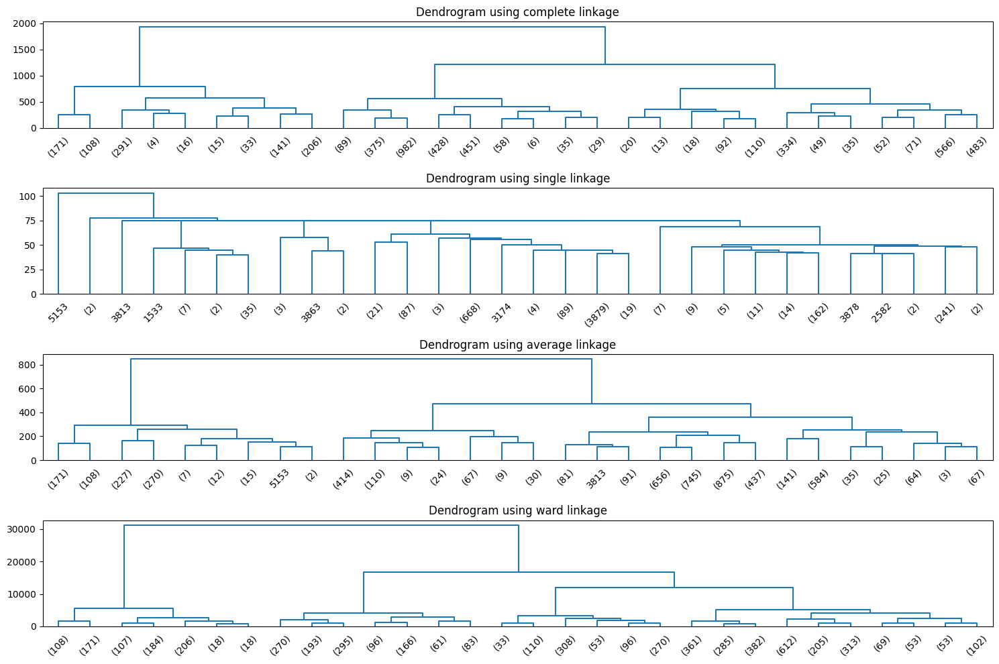

In [40]:
# Calculate distances and build dendrograms with different linkage methods
methods = ['complete', 'single', 'average','ward']
plt.figure(figsize=(15, 10))
for i, method in enumerate(methods, 1):
    plt.subplot(4, 1, i)
    data_dist = pdist(data_psq, metric='euclidean')
    data_link = linkage(data_dist, method=method)
    dendrogram(data_link, color_threshold=10, truncate_mode='lastp')
    plt.title(f'Dendrogram using {method} linkage')
plt.tight_layout()
plt.show()

As we can see from these dendograms the branches are more similar overall. it appears to have not so distant elements nor that similar. it creates quite well separeted some groups with the close values.

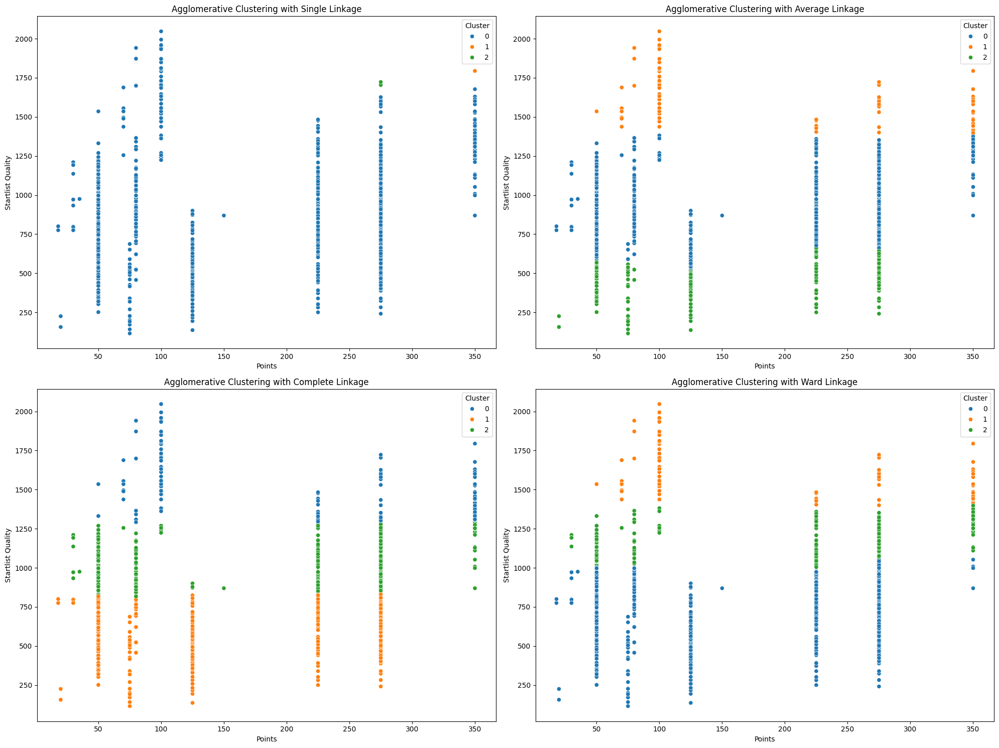

In [41]:
# List of linkage methods
linkage_methods = ['single', 'average', 'complete', 'ward']

# Create a plot for each linkage method
plt.figure(figsize=(20, 15))
for i, method in enumerate(linkage_methods, 1):
    # Create the clustering model
    agg_cluster = AgglomerativeClustering(n_clusters=3, metric='euclidean', linkage=method)
    
    # Use .loc to avoid the SettingWithCopyWarning
    data_psq = data_psq.copy()
    data_psq.loc[:, 'cluster'] = agg_cluster.fit_predict(data_psq[['points', 'startlist_quality']])

    # Create the scatter plot
    plt.subplot(2, 2, i)
    sns.scatterplot(data=data_psq, x='points', y='startlist_quality', hue='cluster', palette=sns.color_palette(n_colors=3))
    plt.title(f'Agglomerative Clustering with {method.capitalize()} Linkage')
    plt.xlabel('Points')
    plt.ylabel('Startlist Quality')
    plt.legend(title='Cluster')

plt.tight_layout()
plt.show()

As always the single linkage uses sparse data to build the second and third cluster while having the main cluster contains almost the whole collection of elements.
With average the situation is quite different than before since it starts behaving by dividing in rows the clusters.
Same with complete and ward linkage, but linkage leave more margin for the cluster in the middle

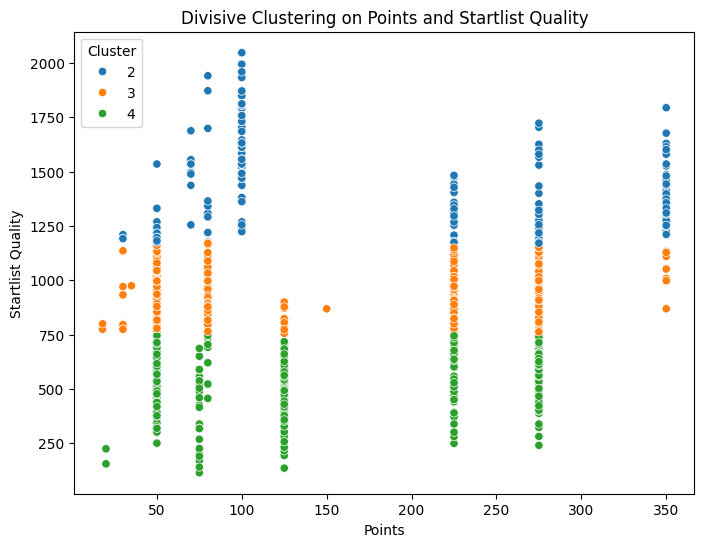

In [42]:
data_psq = data_psq[['points', 'startlist_quality']].to_numpy()

# Apply divisive clustering
n_clusters = 3
cluster_labels = divisive_clustering(data_psq, max_clusters=n_clusters)

# Display the clusters
plt.figure(figsize=(8, 6))
sns.scatterplot(x=data_psq[:, 0], y=data_psq[:, 1], hue=cluster_labels, palette=sns.color_palette(n_colors=n_clusters))
plt.title('Divisive Clustering on Points and Startlist Quality')
plt.xlabel('Points')
plt.ylabel('Startlist Quality')
plt.legend(title='Cluster')
plt.show()

The divisive also this time works quite well having the almost the same result as the complete linkage

## Additional Clusterings


### OPTICS Clustering

OPTICS (Ordering Points To Identify the Clustering Structure) is a density-based clustering algorithm. It is designed to identify clusters of varying densities in a dataset by analyzing the density-reachability of points.

For each point, the algorithm calculates the *core distance*, which is the minimum distance needed to consider that point as a core point, given a certain **radius** parameter. The *reachability distance* (**neighbors**) of a point is the distance needed to reach it from a core point. This helps determine how reachable a point is from others in its vicinity. OPTICS processes all points in the dataset and orders them based on reachability distance, which helps create a structure for visualizing the clustering. This ordering enables the detection of clusters at different density levels. By analyzing the reachability plot, clusters are identified as valleys (low-reachability regions), while noise points and outliers are detected as those with high reachability distances.

OPTICS is especially useful for identifying clusters with different shapes and densities, making it more flexible than DBSCAN for complex datasets.

### 1. Applyting OPTICS to *weight* and *height*

The plot shows a single large cluster with some noisy values scattered around, as expected. The radius and neighbors parameters were chosen specifically to highlight these noisy values.

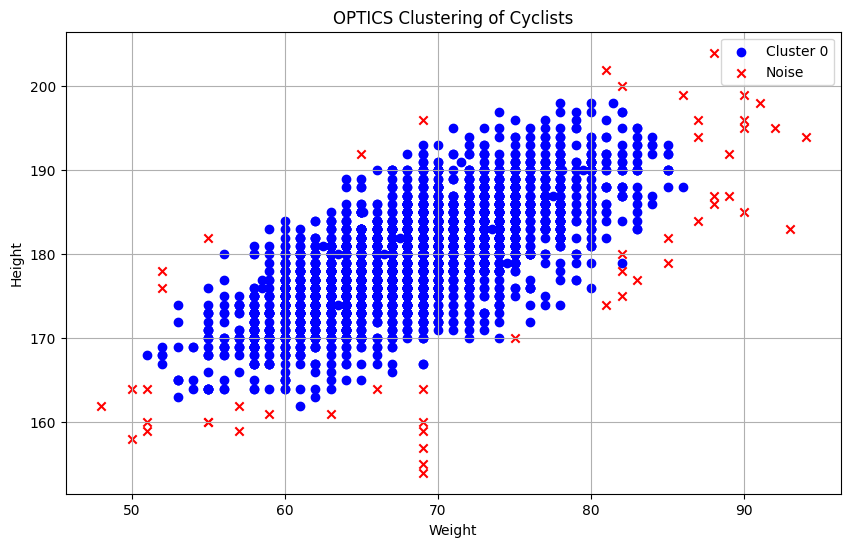

In [43]:
data_array = cyclists[['weight', 'height']].values

# OPTICS algorithm parameters
radius = 2.0  # Maximum distance to consider points in the same cluster
neighbors = 5  # Minimum number of points to form a cluster

# Initialize the OPTICS instance
optics_instance = optics(data_array, radius, neighbors)

# Run the OPTICS algorithm
(ticks, result) = timedcall(optics_instance.process)

# Extract clusters and noise
clusters = optics_instance.get_clusters()
noise = optics_instance.get_noise()

# Visualize the clusters
plt.figure(figsize=(10, 6))
colors = ['b', 'g', 'c', 'm', 'y']  # Colors for the clusters

# Plot each cluster with a different color
for cluster_id, cluster in enumerate(clusters):
    cluster_data = data_array[np.array(cluster, dtype=int)]  # Ensure cluster is an integer list or array
    plt.scatter(cluster_data[:, 0], cluster_data[:, 1], label=f'Cluster {cluster_id}', color=colors[cluster_id % len(colors)])

# Plot noise points
noise_data = data_array[np.array(noise, dtype=int)]  # Ensure noise is an integer list or array
plt.scatter(noise_data[:, 0], noise_data[:, 1], color='r', marker='x', label='Noise')

# Add labels and title
plt.xlabel('Weight')
plt.ylabel('Height')
plt.title('OPTICS Clustering of Cyclists')
plt.legend()
plt.grid(True)
plt.show()


### 2. Applyting OPTICS to *bmi* and *avg_position*

For the *bmi* and *position* we decide to use the same *radius* and *neighbors* values used before.

The results showed consist another time in a single large cluster with some noisy values.

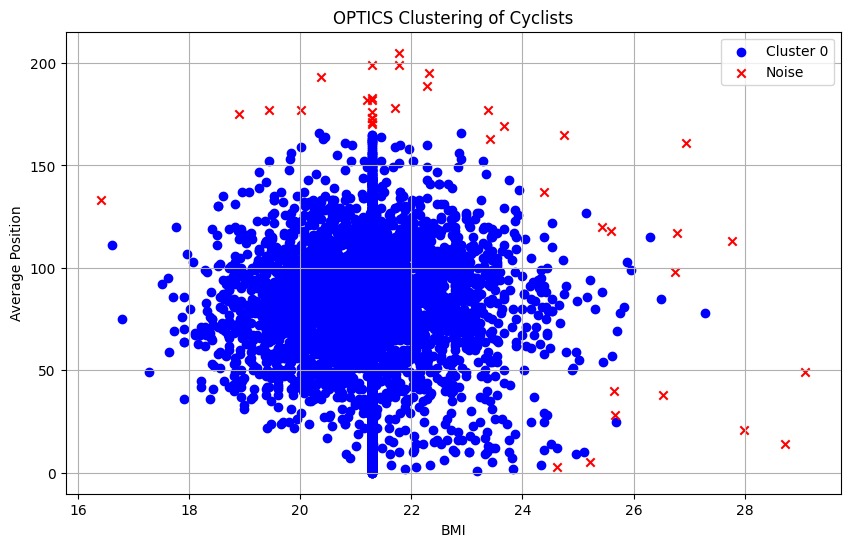

In [44]:
data_array = cyclists[['bmi', 'avg_position']].values

# OPTICS algorithm parameters
radius = 2.0  # Maximum distance to consider points in the same cluster
neighbors = 5  # Minimum number of points to form a cluster

# Initialize the OPTICS instance
optics_instance = optics(data_array, radius, neighbors)

# Run the OPTICS algorithm
(ticks, result) = timedcall(optics_instance.process)

# Extract clusters and noise
clusters = optics_instance.get_clusters()
noise = optics_instance.get_noise()

# Visualize the clusters
plt.figure(figsize=(10, 6))
colors = ['b', 'g', 'c', 'm', 'y']  # Colors for the clusters

# Plot each cluster with a different color
for cluster_id, cluster in enumerate(clusters):
    cluster_data = data_array[np.array(cluster, dtype=int)]  # Ensure cluster is an integer list or array
    plt.scatter(cluster_data[:, 0], cluster_data[:, 1], label=f'Cluster {cluster_id}', color=colors[cluster_id % len(colors)])

# Plot noise points
noise_data = data_array[np.array(noise, dtype=int)]  # Ensure noise is an integer list or array
plt.scatter(noise_data[:, 0], noise_data[:, 1], color='r', marker='x', label='Noise')

# Add labels and title
plt.xlabel('BMI')
plt.ylabel('Average Position')
plt.title('OPTICS Clustering of Cyclists')
plt.legend()
plt.grid(True)
plt.show()

### 3. Applying OPTICS to *avg_delta* and *avg_position*.

In the *avg_delta* and *avg_position* case we use a *radius*=20 and *neighbors*=5 to better highlight the noise.

This time, we can observe distinct clusters. Cluster 0 still contains the majority of the values, but we also notice a significant number of noisy values.

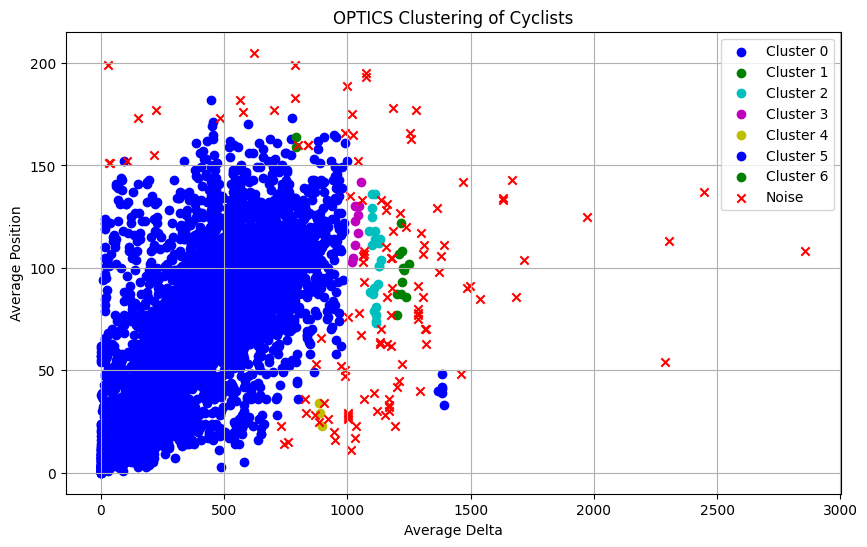

In [45]:
data_array = cyclists[['avg_delta', 'avg_position']].values

# OPTICS algorithm parameters
radius = 20.0  # Maximum distance to consider points in the same cluster
neighbors = 5  # Minimum number of points to form a cluster

# Initialize the OPTICS instance
optics_instance = optics(data_array, radius, neighbors)

# Run the OPTICS algorithm
(ticks, result) = timedcall(optics_instance.process)

# Extract clusters and noise
clusters = optics_instance.get_clusters()
noise = optics_instance.get_noise()

# Visualize the clusters
plt.figure(figsize=(10, 6))
colors = ['b', 'g', 'c', 'm', 'y']  # Colors for the clusters

# Plot each cluster with a different color
for cluster_id, cluster in enumerate(clusters):
    cluster_data = data_array[np.array(cluster, dtype=int)]  # Ensure cluster is an integer list or array
    plt.scatter(cluster_data[:, 0], cluster_data[:, 1], label=f'Cluster {cluster_id}', color=colors[cluster_id % len(colors)])

# Plot noise points
noise_data = data_array[np.array(noise, dtype=int)]  # Ensure noise is an integer list or array
plt.scatter(noise_data[:, 0], noise_data[:, 1], color='r', marker='x', label='Noise')

# Add labels and title
plt.xlabel('Average Delta')
plt.ylabel('Average Position')
plt.title('OPTICS Clustering of Cyclists')
plt.legend()
plt.grid(True)
plt.show()

### 4. Applying OPTICS to *points* and *race_intensity*.

Using the same *radius* and *neighbors* from the first one we can see eleven clusters well-defined with very few noisy values.

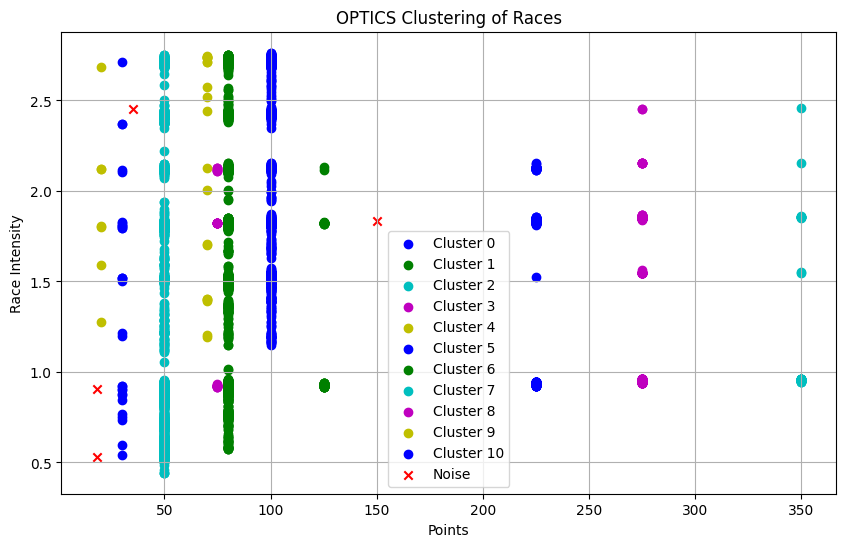

In [46]:
races_unique = races.drop_duplicates(subset='_url')[['points', 'race_intensity']]
data_array = races_unique.values

# OPTICS algorithm parameters
radius = 2.0  # Maximum distance to consider points in the same cluster
neighbors = 5  # Minimum number of points to form a cluster

# Initialize the OPTICS instance
optics_instance = optics(data_array, radius, neighbors)

# Run the OPTICS algorithm
(ticks, result) = timedcall(optics_instance.process)

# Extract clusters and noise
clusters = optics_instance.get_clusters()
noise = optics_instance.get_noise()

# Visualize the clusters
plt.figure(figsize=(10, 6))
colors = ['b', 'g', 'c', 'm', 'y']  # Colors for the clusters

# Plot each cluster with a different color
for cluster_id, cluster in enumerate(clusters):
    cluster_data = data_array[np.array(cluster, dtype=int)]  # Ensure cluster is an integer list or array
    plt.scatter(cluster_data[:, 0], cluster_data[:, 1], label=f'Cluster {cluster_id}', color=colors[cluster_id % len(colors)])

# Plot noise points
noise_data = data_array[np.array(noise, dtype=int)]  # Ensure noise is an integer list or array
plt.scatter(noise_data[:, 0], noise_data[:, 1], color='r', marker='x', label='Noise')

# Add labels and title
plt.xlabel('Points')
plt.ylabel('Race Intensity')
plt.title('OPTICS Clustering of Races')
plt.legend()
plt.grid(True)
plt.show()

### 5. Applying OPTICS to *points* and *startlist_quality*.

To conclude the OPTICS clustering we compute that on *points* and *startlist_quality* with a *radius*=60 and *neighbors*=10.

The clusters appear to be well-defined. Cluster 0 remains the largest, and this time the noisy values are concentrated at the lower and higher ends of *startlist_quality* for each cluster.

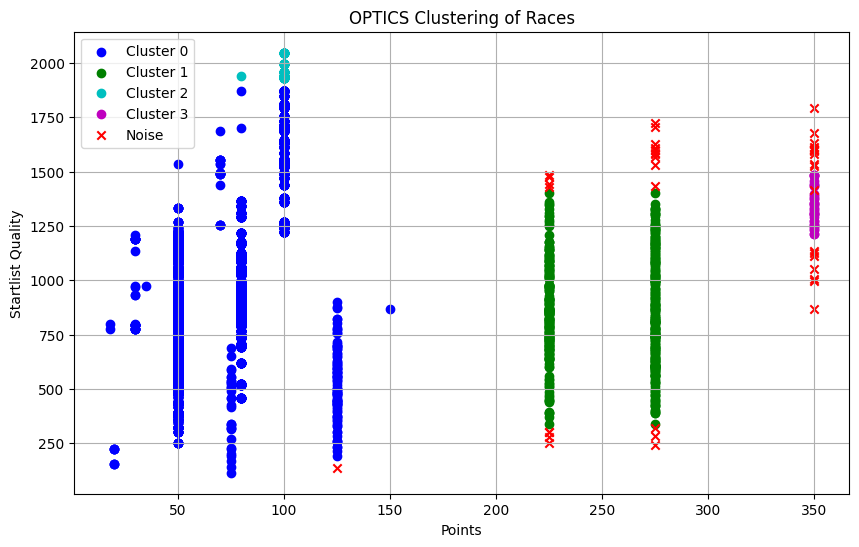

In [47]:
races_unique = races.drop_duplicates(subset='_url')[['points', 'startlist_quality']]
data_array = races_unique.values

# OPTICS algorithm parameters
radius = 60.0  # Maximum distance to consider points in the same cluster
neighbors = 10  # Minimum number of points to form a cluster

# Initialize the OPTICS instance
optics_instance = optics(data_array, radius, neighbors)

# Run the OPTICS algorithm
(ticks, result) = timedcall(optics_instance.process)

# Extract clusters and noise
clusters = optics_instance.get_clusters()
noise = optics_instance.get_noise()

# Visualize the clusters
plt.figure(figsize=(10, 6))
colors = ['b', 'g', 'c', 'm', 'y']  # Colors for the clusters

# Plot each cluster with a different color
for cluster_id, cluster in enumerate(clusters):
    cluster_data = data_array[np.array(cluster, dtype=int)]  # Ensure cluster is an integer list or array
    plt.scatter(cluster_data[:, 0], cluster_data[:, 1], label=f'Cluster {cluster_id}', color=colors[cluster_id % len(colors)])

# Plot noise points
noise_data = data_array[np.array(noise, dtype=int)]  # Ensure noise is an integer list or array
plt.scatter(noise_data[:, 0], noise_data[:, 1], color='r', marker='x', label='Noise')

# Add labels and title
plt.xlabel('Points')
plt.ylabel('Startlist Quality')
plt.title('OPTICS Clustering of Races')
plt.legend()
plt.grid(True)
plt.show()

### CURE Clustering

CURE (Clustering Using Representatives) is an advanced hierarchical clustering algorithm that is designed to handle large datasets and identify clusters of different shapes and sizes. 

CURE starts by taking a random sample of the dataset to reduce computational complexity. This sample is used to approximate the overall data distribution. Initially, each point in the sample is treated as an individual cluster. The algorithm iteratively merges clusters based on their closest pair of representative points, similar to hierarchical clustering. For each cluster, CURE selects a fixed number of well-scattered points (known as *representative points*). These points are used to better capture the shape and spread of the cluster. To avoid sensitivity to outliers and better represent the true cluster shape, the representative points are shrunk towards the cluster's centroid by a specified fraction. This step helps balance cluster compactness and variability.
The algorithm continues to merge clusters based on the minimum distance between their representative points until a stopping condition (like a predefined number of clusters) is met. The final output shows clusters that can capture non-spherical and irregular shapes more effectively than standard hierarchical or centroid-based methods.

CURE is particularly useful for detecting clusters of arbitrary shapes and handling outliers robustly, which is an advantage over traditional algorithms like k-means that assume spherical clusters.


### 1. Applying CURE to *weight* and *height*.


We decided to use the Elbow Method, as applied in the K-means section, to determine the optimal number of clusters. This resulted in three well-defined clusters: the first contains the majority of the values, while the other two include only a small number of values each.

Cluster 0: 19 elements
Cluster 1: 6071 elements
Cluster 2: 5 elements


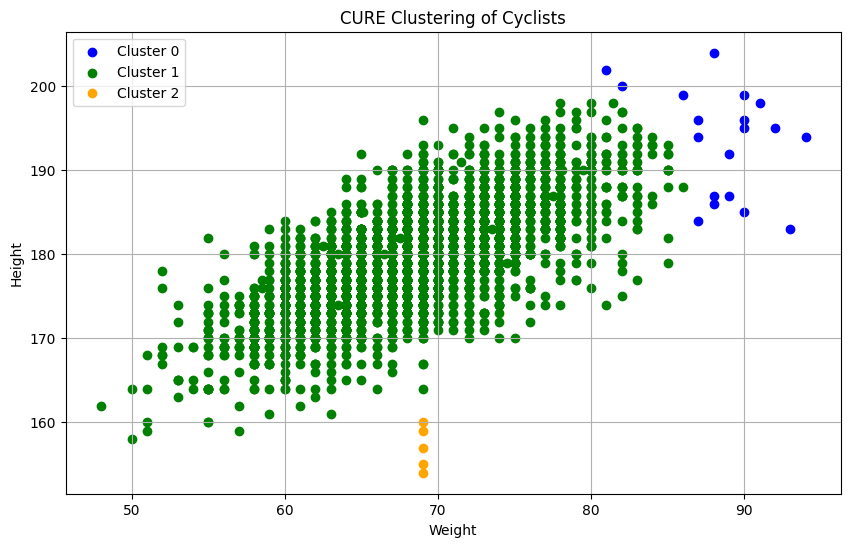

In [48]:
# Convert the data to a list of lists for use with the CURE library
data_list = cyclists[['weight', 'height']].values.tolist()

# Initialize the CURE instance for clustering with 3 clusters
cure_instance = cure(data_list, 3)
cure_instance.process()
clusters = cure_instance.get_clusters()

# Print information about the clusters
for i, cluster in enumerate(clusters):
    print(f"Cluster {i}: {len(cluster)} elements")

# Visualize the clusters using matplotlib
plt.figure(figsize=(10, 6))
colors = ['blue', 'green', 'orange']
for i, cluster in enumerate(clusters):
    cluster_points = np.array([data_list[j] for j in cluster])
    plt.scatter(cluster_points[:, 0], cluster_points[:, 1], label=f'Cluster {i}', color=colors[i % len(colors)])

plt.xlabel('Weight')
plt.ylabel('Height')
plt.title('CURE Clustering of Cyclists')
plt.legend()
plt.grid(True)
plt.show()

### 2. Applying CURE to *bmi* and *avg_position*.

For *bmi* and *avg_position* the number of cluster still three.

In this plot, Cluster 0 is the largest, followed by Cluster 1, which contains approximately 1,000 elements. Cluster 2 can be considered a noisy cluster.

Cluster 0: 5318 elements
Cluster 1: 756 elements
Cluster 2: 21 elements


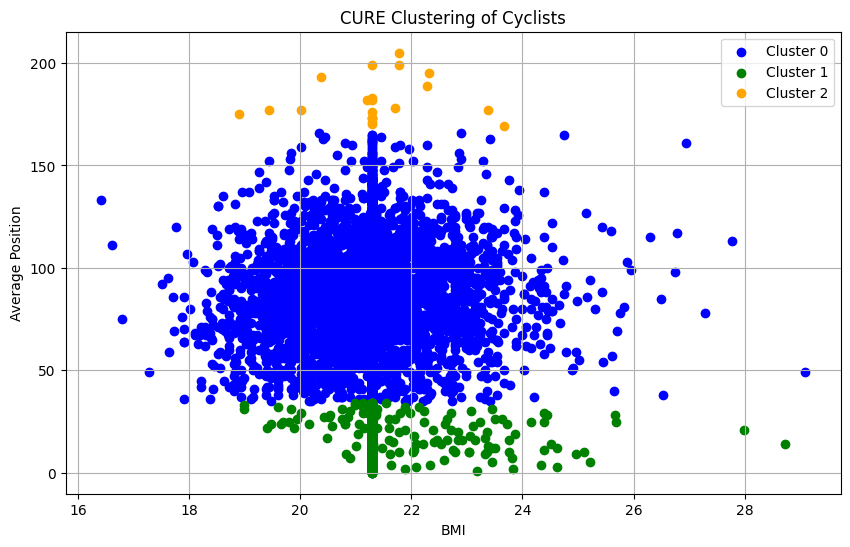

In [49]:
# Convert the data to a list of lists for use with the CURE library
data_list = cyclists[['bmi', 'avg_position']].values.tolist()

# Initialize the CURE instance for clustering with 3 clusters
cure_instance = cure(data_list, 3)
cure_instance.process()
clusters = cure_instance.get_clusters()

# Print information about the clusters
for i, cluster in enumerate(clusters):
    print(f"Cluster {i}: {len(cluster)} elements")

# Visualize the clusters using matplotlib
plt.figure(figsize=(10, 6))
colors = ['blue', 'green', 'orange']
for i, cluster in enumerate(clusters):
    cluster_points = np.array([data_list[j] for j in cluster])
    plt.scatter(cluster_points[:, 0], cluster_points[:, 1], label=f'Cluster {i}', color=colors[i % len(colors)])

plt.xlabel('BMI')
plt.ylabel('Average Position')
plt.title('CURE Clustering of Cyclists')
plt.legend()
plt.grid(True)
plt.show()

### 3. Applying CURE to *avg_delta* and *avg_position*.

The clustering of *avg_delta* and *avg_position* is also performed with three clusters.

It is evident that Cluster 2 contains 99% of the data, while the other two clusters can be considered as noise.

Cluster 0: 1 elements
Cluster 1: 3 elements
Cluster 2: 6091 elements


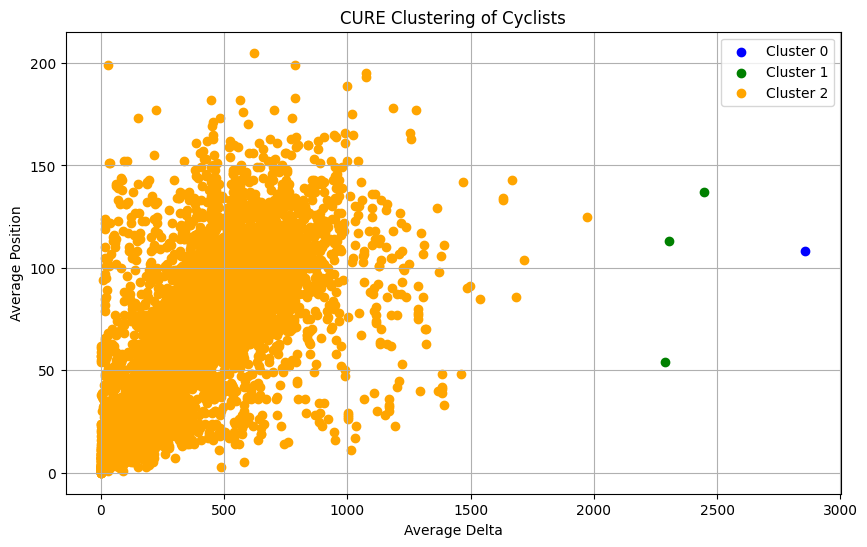

In [50]:
# Convert the data to a list of lists for use with the CURE library
data_list = cyclists[['avg_delta', 'avg_position']].values.tolist()

# Initialize the CURE instance for clustering with 3 clusters
cure_instance = cure(data_list, 3)
cure_instance.process()
clusters = cure_instance.get_clusters()

# Print information about the clusters
for i, cluster in enumerate(clusters):
    print(f"Cluster {i}: {len(cluster)} elements")

# Visualize the clusters using matplotlib
plt.figure(figsize=(10, 6))
colors = ['blue', 'green', 'orange']
for i, cluster in enumerate(clusters):
    cluster_points = np.array([data_list[j] for j in cluster])
    plt.scatter(cluster_points[:, 0], cluster_points[:, 1], label=f'Cluster {i}', color=colors[i % len(colors)])

plt.xlabel('Average Delta')
plt.ylabel('Average Position')
plt.title('CURE Clustering of Cyclists')
plt.legend()
plt.grid(True)
plt.show()

### 4. Applying CURE to *position* and *race_intensity*.

For *position* and *race_intensity*, the number of clusters chosen is two.

The situation is similar to that observed with K-means, with two well-formed clusters containing the same values.

Cluster 0: 510 elements
Cluster 1: 4771 elements


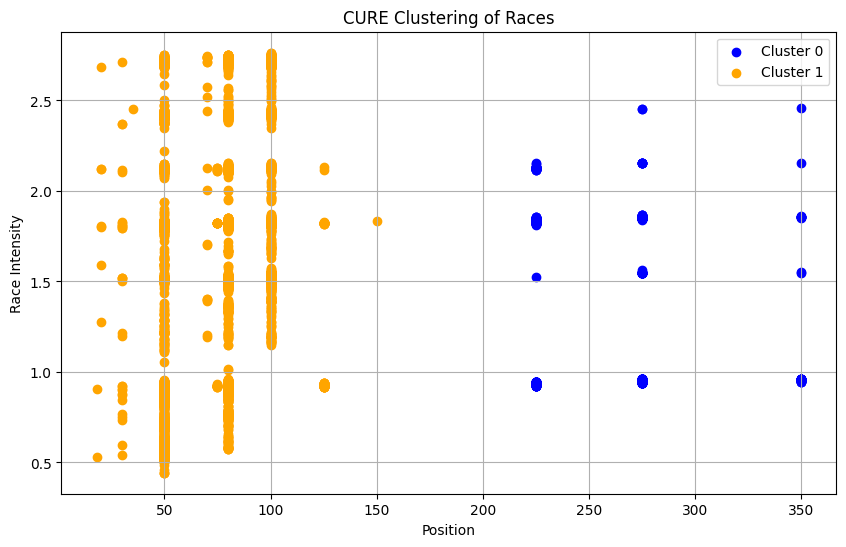

In [51]:
# Convert the data to a list of lists for use with the CURE library
races_unique = races.drop_duplicates(subset='_url')[['points', 'race_intensity']]
data_list = races_unique.values.tolist()

# Initialize the CURE instance for clustering with 2 clusters
cure_instance = cure(data_list, 2)
cure_instance.process()
clusters = cure_instance.get_clusters()

# Print information about the clusters
for i, cluster in enumerate(clusters):
    print(f"Cluster {i}: {len(cluster)} elements")

# Visualize the clusters using matplotlib
plt.figure(figsize=(10, 6))
colors = ['blue','orange']
for i, cluster in enumerate(clusters):
    cluster_points = np.array([data_list[j] for j in cluster])
    plt.scatter(cluster_points[:, 0], cluster_points[:, 1], label=f'Cluster {i}', color=colors[i % len(colors)])

plt.xlabel('Position')
plt.ylabel('Race Intensity')
plt.title('CURE Clustering of Races')
plt.legend()
plt.grid(True)
plt.show()

### 5. Applying CURE to *position* and *startlist_quality*.

As observed earlier, the classification based on *startlist_quality* splits the data into three clusters, with no small clusters containing only a few values.

Cluster 0: 3252 elements
Cluster 1: 1250 elements
Cluster 2: 779 elements


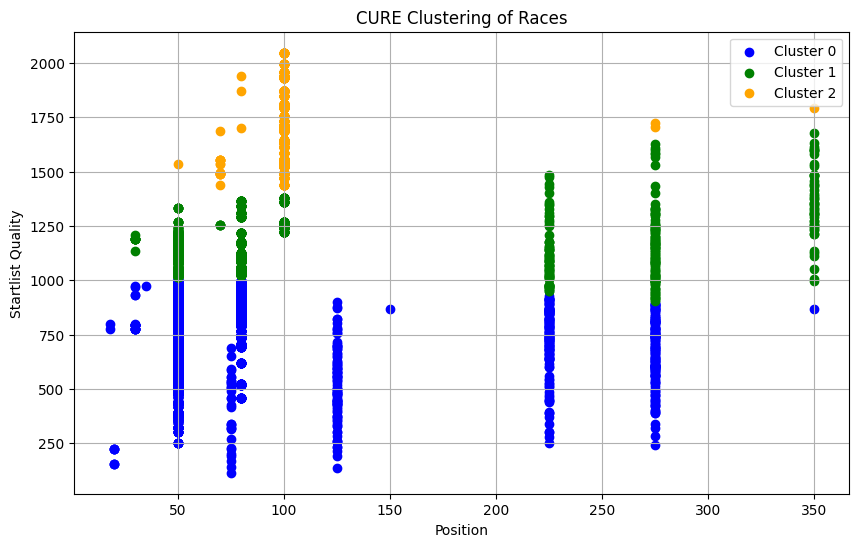

In [52]:
# Convert the data to a list of lists for use with the CURE library
races_unique = races.drop_duplicates(subset='_url')[['points', 'startlist_quality']]
data_list = races_unique.values.tolist()

# Initialize the CURE instance for clustering with 3 clusters
cure_instance = cure(data_list, 3)
cure_instance.process()
clusters = cure_instance.get_clusters()

# Print information about the clusters
for i, cluster in enumerate(clusters):
    print(f"Cluster {i}: {len(cluster)} elements")

# Visualize the clusters using matplotlib
plt.figure(figsize=(10, 6))
colors = ['blue', 'green', 'orange']
for i, cluster in enumerate(clusters):
    cluster_points = np.array([data_list[j] for j in cluster])
    plt.scatter(cluster_points[:, 0], cluster_points[:, 1], label=f'Cluster {i}', color=colors[i % len(colors)])

plt.xlabel('Position')
plt.ylabel('Startlist Quality')
plt.title('CURE Clustering of Races')
plt.legend()
plt.grid(True)
plt.show()

## Analysis and Conclusions
To conclude we compare the clustering results for each pair of features and evaluate the performance of the methods used, highlighting their strengths and limitations.

- **Weight and Height**:
methods such as K-means, Complete Linkage, Ward Linkage, and Divisive clustering successfully divided the data into homogeneous clusters, effectively capturing the inherent relationships between the features. In contrast, DBSCAN, Single Linkage, Average Linkage, and CURE produced one large cluster with multiple smaller clusters. According to OPTICS, these smaller clusters were mostly classified as noise, suggesting that these methods are less suitable for these features. One could consider using these methods to remove noise first and then applying the initial methods to perform the actual clustering.

- **BMI and Average Position**:
K-means performed particularly well, similar to Average, Complete and Ward Linkage and Divisive clustering methods. This success can be attributed to the average distance metric, which is especially meaningful for these features due to their distribution. These methods produced well-separated clusters, effectively representing the variability in the data. On the other hand, DBSCAN, Single Linkage, and OPTICS identify a single large cluster with a few noisy values around it. CURE find two bigger clusters and a smaller one that contains very few values.

- **Average Delta and Average Position**:
a noticeable trend of increasing noise values was observed as avg_delta grew. While noise values were fewer in number, their presence might suggest the need for their removal in downstream clustering applications. Among the methods, CURE stood out as particularly effective, clearly distinguishing between the main cluster and the noise clusters. Among the hierarchical methods, only Ward Linkage produces a noteworthy division comparable to that of K-means.

- **Points and Race Intensity**:
methods such as DBSCAN and OPTICS divided the data along columns, with OPTICS identifying only a few noise points. Hierarchical methods, on the other hand, grouped data into multiple columns, effectively capturing the fixed nature of the *points* values. However, K-means and CURE simplified the clustering by dividing the data into two large groups, due to the empty space in the middle. This behavior demonstrates that while these methods can summarize the data, they might not fully capture the nuances of the distribution.

- **Points and Startlist Quality**:
as previously noted, the feature *startlist_quality* carries more weight than *points*, which shifts the centroids toward the right. Most methods produced cluster divisions aligned along rows, except for DBSCAN, which failed to provide meaningful clusters, reaffirming its unsuitability for this feature pair. OPTICS performed well, dividing the data into columns with minimal noise at the boundaries. Single Linkage failed to create distinct clusters, while all other methods showed results similar to K-means, effectively partitioning the data.